# Тестовое задание для стажера (Python ML) на прогнозирование

**Цель: Разработать модель для прогнозирования стоимости квартиры с учетом параметров квартиры и выполнения евроремонта.**

**Данные:**
- `flats.xlsx` - данные о квартирах без евроремонта за квадратный метр 
- `euro_renovation.xlsx` - данные о квартирах с евроремонтом за квадратный метр

**Задачи:**
- Разработать модель машинного обучения для прогноза стоимости квартир flats.xlsx, если в них выполнят евроремонт на основании данных квартир с евроремонтом euro_renovation.xlsx
- Валидация модели и оценка точности на тестовой выборке 
- Подготовка итогового отчета в Jupyter Notebook (Оценка)
- Добавить данные по стоимости квартиры с евроремонтом в flats.xlsx в отдельный столбец


**Оценка:**
- Обоснование выбора и применение ML алгоритмов
- Показать метрики качества модели и их анализ (например, MSE, MAE, R2)
- Структура и стиль Notebook


## Подготовка данных

### Импортируем библиотеки

In [1]:
# импорты сторонних библиотек
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import warnings
import time
from tqdm import tqdm

# импорты модулей текущего проекта
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    make_scorer,
    r2_score
)

from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    cross_val_score,
    RepeatedKFold
)

from pandas_profiling import ProfileReport

from catboost import Pool, CatBoostRegressor, cv
from lightgbm import LGBMRegressor

import phik
from phik.report import plot_correlation_matrix
from phik import report

C:\Users\lexus\anaconda3\envs\practicum\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
C:\Users\lexus\anaconda3\envs\practicum\lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\lexus\anaconda3\envs\practicum\lib\site-packages\visions\backends\shared\nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io

In [2]:
#import xlrd
import openpyxl

In [3]:
#pd.reset_option('display.float_format')

In [4]:
pd.set_option('display.max_columns', None)

In [5]:
warnings.filterwarnings('ignore')

### Считаем данные из файла и сохраним их в переменную

In [6]:
def read_xls(path):
    wookbook = openpyxl.load_workbook(path)
    worksheet = wookbook.active
    
    columns_list = []
    for i in range(1, 2):#worksheet.max_row):
        for col in worksheet.iter_cols(1, worksheet.max_column):
            #print(col[i].value, end="\t\t")
            columns_list.append(col[i].value)
        #print('')
        
    df = pd.DataFrame(columns=columns_list)

    for i in tqdm(range(1, worksheet.max_row)):
    
        row_values = []
        for col in worksheet.iter_cols(1, worksheet.max_column):
            row_values.append(col[i].value)
        
        df.loc[len(df.index)] = row_values
    
    return df[1:]

In [7]:
df_flats = read_xls("flats.xlsx")

100%|██████████████████████████████████████████████████████████████████████████████| 6692/6692 [29:02<00:00,  3.84it/s]


In [8]:
df_euro = read_xls("euro_renovation.xlsx")

100%|██████████████████████████████████████████████████████████████████████████████| 1321/1321 [01:09<00:00, 19.03it/s]


In [9]:
# сделаем резервные копии загруженных файлов
df_reserve_flats = df_flats.copy()
df_reserve_euro = df_euro.copy()

In [10]:
#df_reserve_flats

In [11]:
#df_reserve_euro

In [12]:
# сохраним резервные копии в виде файлов csv
df_reserve_flats.to_csv('optimum_reserve_flats.csv', index=False)
df_reserve_euro.to_csv('optimum_reserve_euro.csv', index=False)

In [13]:
# считаем файлы в соответсвующие переменные (так формат данных проставится автоматически)
df_flats = pd.read_csv('optimum_reserve_flats.csv', dtype={'id': 'int', 'offer_views': 'int',
                                               'house_floors': 'int',
                                               'lifts': 'int', 'freight_lifts': 'int'})

In [14]:
df_euro = pd.read_csv('optimum_reserve_euro.csv', dtype={'id': 'int', 'offer_views': 'int',
                                               'house_floors': 'int',
                                               'lifts': 'int', 'freight_lifts': 'int'}) 

In [15]:
# склеим данные из двух файлов в один
df = pd.concat([df_flats, df_euro], ignore_index=True )

df_flats[(~df_flats['balconies'].isna())&(df_flats['balconies']!=df_flats['all_data.object_info.loggias'])][['balconies','all_data.object_info.loggias']].head(20) #

### Выведем 10 строк датафрейма

In [16]:
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,all_data.house.ceiling_height,all_data.house.has_garbage_disposer,all_data.object_info.living_area,all_data.object_info.loggias,all_data.house.parking[0].display_name,all_data.house.yard[0].display_name,all_data.house.yard[1].display_name,all_data.house.infrastructure[0].display_name,all_data.house.infrastructure[1].display_name,all_data.house.infrastructure[2].display_name,all_data.house.infrastructure[3].display_name,all_data.house.infrastructure[4].display_name,all_data.object_info.garage_type.display_name
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,NaN,None,1.0,None,23,Монолитный,1,0,24.0,2022.0,False,0.0,Свободная продажа,2.80,False,20.4,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,NaN,None,1.0,True,6,Кирпичный,0,0,5.0,1900.0,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,Косметический,False,1.0,False,5,Кирпичный,0,0,NaN,1950.0,False,0.0,Свободная продажа,NaN,False,14.5,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,Косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964.0,False,0.0,Свободная продажа,2.80,False,18.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,NaN,False,2.0,True,10,Кирпичный,1,0,NaN,2013.0,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,Евро,False,0.0,False,15,Кирпично-монолитный,1,0,NaN,2019.0,False,0.0,Свободная продажа,NaN,NaN,20.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,Евро,False,0.0,False,17,Монолитный,2,0,NaN,2021.0,False,0.0,Свободная продажа,2.75,False,18.0,NaN,Подземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,Евро,False,0.0,None,24,Монолитный,3,0,NaN,2023.0,False,0.0,Переуступка,2.70,False,20.0,NaN,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евроремонт,False,0.0,None,17,Монолитный,1,0,36.0,2017.0,False,0.0,Свободная продажа,2.65,NaN,16.5,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# переименуем колонки для удобства
df = df.rename(columns={'all_data.object_info.garage_type.display_name': 'garage_type', 
                        'all_data.house.infrastructure[4].display_name': 'infrastructure_4', 
                        'all_data.house.infrastructure[3].display_name': 'infrastructure_3', 
                        'all_data.house.infrastructure[2].display_name': 'infrastructure_2', 
                        'all_data.house.infrastructure[1].display_name': 'infrastructure_1',
                        'all_data.house.infrastructure[0].display_name': 'infrastructure_0',
                        'all_data.house.yard[1].display_name': 'yard_1',
                        'all_data.house.yard[0].display_name': 'yard_0',
                        'all_data.house.parking[0].display_name': 'parking_0',
                        'all_data.object_info.loggias': 'loggias',
                        'all_data.object_info.living_area': 'living_area',
                        'all_data.house.has_garbage_disposer': 'has_garbage_disposer',
                        'all_data.house.ceiling_height': 'ceiling_height'})

### Выведем основную информацию о датафрейме с помощью метода info()

In [18]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8011 entries, 0 to 8010
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      8011 non-null   int32  
 1   offer_views             8011 non-null   int32  
 2   city                    8011 non-null   object 
 3   lat                     8011 non-null   float64
 4   lon                     8011 non-null   float64
 5   price_sq                8010 non-null   float64
 6   area                    8010 non-null   float64
 7   floor                   8010 non-null   float64
 8   kitchen_area            8011 non-null   float64
 9   bathroom_type           8011 non-null   object 
 10  balconies               8011 non-null   float64
 11  renovation              4919 non-null   object 
 12  is_apartment            8011 non-null   object 
 13  rooms                   8010 non-null   float64
 14  has_gas                 8011 non-null   

### Проверим данные на наличие дубликатов

In [19]:
df.duplicated().sum() #['house_floors', 'house_wall_type', 'build_year','time_on_foot_to_subway']

0

Создадим справку по домам, в которых продается больше 1 квартиры

In [20]:
spravka = df[df[['lat','lon']].duplicated()][['lat','lon','house_floors','house_wall_type','time_on_foot_to_subway','ceiling_height','build_year']].sort_values(by='lon') #.groupby(['lat','lon']).agg({'build_year':'mean'})
spravka.shape

(3752, 7)

In [21]:
spravka.groupby(['lat','lon']).agg({'house_floors':'median',
                                   'time_on_foot_to_subway':'median',
                                   'ceiling_height':'median',
                                   'build_year':'median'}).reset_index()

,lat,lon,house_floors,time_on_foot_to_subway,ceiling_height,build_year
0,54.857248,82.989851,8.0,NaN,NaN,2020.0
1,54.860223,82.978622,5.0,NaN,NaN,1973.0
2,54.862181,82.974993,3.0,NaN,NaN,NaN
3,54.866927,82.972128,18.0,NaN,2.70,2022.0
4,54.928846,82.922262,5.0,NaN,2.50,1971.0
...,...,...,...,...,...,...
1417,60.059194,30.280313,7.0,NaN,NaN,NaN
1418,60.059234,30.277115,25.0,NaN,2.75,2022.0
1419,60.059351,30.281400,24.0,NaN,2.67,2023.0
1420,60.059813,30.280322,25.0,NaN,2.67,2022.0


### Определим количество и процент пропущенных значений для каждого столбца

In [22]:
# количество пропущенных значений для каждого столбца
print(df.isna().sum())

# процент пропущенных значений для каждого столбца
pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm')

id                           0
offer_views                  0
city                         0
lat                          0
lon                          0
price_sq                     1
area                         1
floor                        1
kitchen_area                 0
bathroom_type                0
balconies                    0
renovation                3092
is_apartment                 0
rooms                        1
has_gas                      0
house_floors                 0
house_wall_type            266
lifts                        0
freight_lifts                0
time_on_foot_to_subway    3568
build_year                 978
urgent                       0
duplicates_count             0
sale_type                 1730
ceiling_height            5339
has_garbage_disposer      3866
living_area               2594
loggias                   6762
parking_0                 5833
yard_0                    4515
yard_1                    5981
infrastructure_0          6268
infrastr

,0
id,0.000000
offer_views,0.000000
city,0.000000
lat,0.000000
lon,0.000000
price_sq,0.000000
area,0.000000
floor,0.000000
kitchen_area,0.000000
bathroom_type,0.000000


В датасете имеется большое количество пропусков. В некоторых столбцах их процент превышает 80% от общего количества записей. 
Рассмотрим каждую колонку в отдельности. Вероятно, некоторые данные удастся восстановить благодаря имеющейся информации. 

### Работа с колонками (пропуски, тип данных, дубли)

#### Первый взгляд на данные

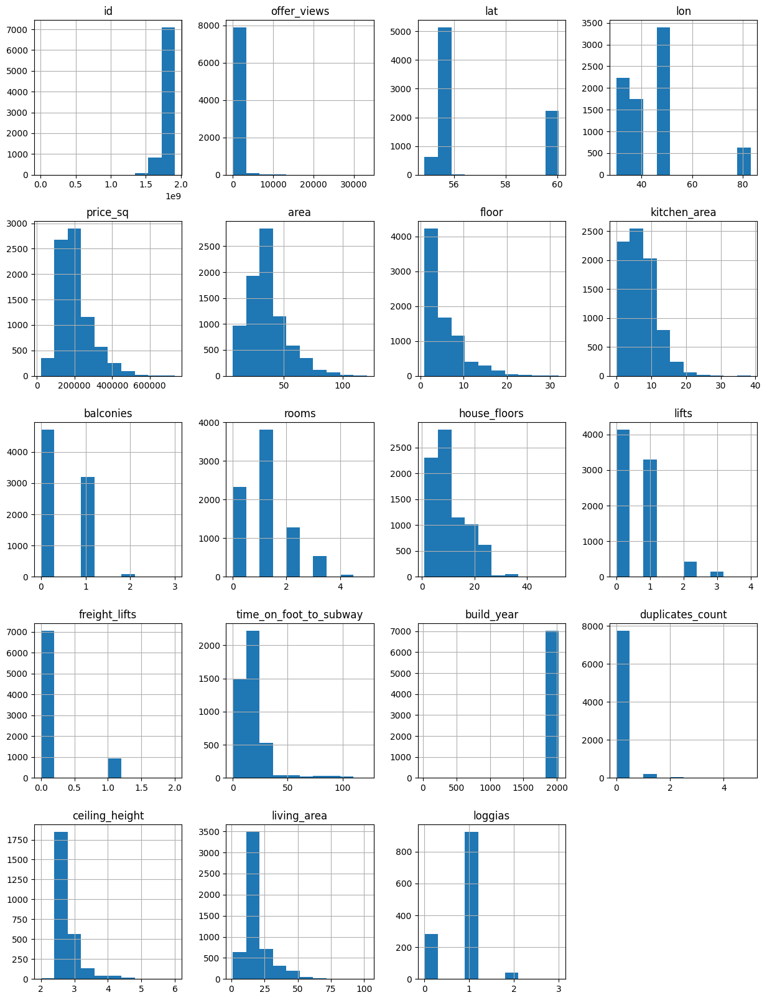

In [23]:
# построим гистрограммы для всех числовых столбцов таблицы
x = df.hist(figsize=(15, 20))
plt.show()

In [24]:
# Посмотрим числовое описание данных
df.describe()

,id,offer_views,lat,lon,price_sq,area,floor,kitchen_area,balconies,rooms,house_floors,lifts,freight_lifts,time_on_foot_to_subway,build_year,duplicates_count,ceiling_height,living_area,loggias
count,8.011000e+03,8011.000000,8011.000000,8011.000000,8010.000000,8010.000000,8010.000000,8011.000000,8011.000000,8010.000000,8011.000000,8011.000000,8011.000000,4443.000000,7033.000000,8011.000000,2672.000000,5417.000000,1249.000000
mean,1.834967e+09,283.312945,56.882351,44.045502,199848.567541,35.298154,5.445069,6.539923,0.423792,1.027466,11.032705,0.575459,0.120210,18.345712,1987.786151,0.040944,2.789356,19.692795,0.810248
std,8.791760e+07,1101.565539,1.920177,13.863967,85559.363699,16.350000,4.445566,4.816243,0.518355,0.888036,6.359255,0.683051,0.329422,14.369622,37.556852,0.251976,0.359588,9.578501,0.480408
min,4.216351e+06,0.000000,54.851464,30.091972,21108.000000,6.500000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,23.000000,0.000000,2.000000,1.000000,0.000000
25%,1.807241e+09,0.000000,55.752708,30.441453,140913.500000,24.000000,2.000000,3.000000,0.000000,0.000000,5.000000,0.000000,0.000000,11.000000,1968.000000,0.000000,2.600000,14.500000,1.000000
50%,1.863524e+09,0.000000,55.812140,48.909943,182370.000000,32.700000,4.000000,6.000000,0.000000,1.000000,9.000000,0.000000,0.000000,16.000000,1983.000000,0.000000,2.700000,17.500000,1.000000
75%,1.895143e+09,162.000000,59.840555,49.187388,240176.250000,43.000000,8.000000,9.500000,1.000000,1.000000,14.000000,1.000000,0.000000,21.000000,2017.000000,0.000000,2.800000,20.800000,1.000000
max,1.916467e+09,33175.000000,60.062759,83.125515,734693.000000,120.600000,32.000000,38.600000,3.000000,5.000000,52.000000,4.000000,2.000000,122.000000,2027.000000,5.000000,6.000000,102.000000,3.000000


In [25]:
# Просмотрим уникальные значения качественных признаков
for col in df.select_dtypes(include='object').columns.to_list():
    print(col)
    print('----------------------------')
    print(df[col].value_counts())
    print()

city
----------------------------
Казань                  3395
Санкт-Петербург         2237
Москва                  1727
Новосибирск              632
поселение Сосенское       13
поселение Мосрентген       4
поселение Московский       3
Name: city, dtype: int64

bathroom_type
----------------------------
None            5976
Совмещенный     1537
Раздельный       490
Более одного       8
Name: bathroom_type, dtype: int64

renovation
----------------------------
Косметический                      1186
Евро                               1104
косметический                       613
Требует ремонта                     474
Дизайнерский                        461
Без ремонта                         388
евроремонт                          211
Отсутствует                         125
Требуется                           121
Хороший                              72
Под чистовой ремонт                  44
С отделкой                           39
Частичный ремонт                     20
чистовая отделк

**Краткий анализ (не завершен)**

**offer_views:** Количество просмотров объявления. В основной массе по нулям. Хотя встречаются записи и до 162, и даже с 33175 просмотрами.

**lat:** Широта местоположения объекта. Меняется от 54.851464 до 60.062759.

**lon:** Долгота местоположения объекта. Меняется от 30.091972 до 83.125515.

**price_sq:** Цена за квадратный метр. Наша целевая переменная. Варьируется от 21108 до 734693 рублей. Медиана - 182370 рублей.

**area:** Площадь объекта. Варьируется от 6.5 до 120.6 кв м. Медиана - 32.7 кв м. То есть чаще всего в объявлениях попадаются однушки и студии.

**floor:** Этаж объекта. Меняется от 1 до 32. Чаще всего продают квартиры со 2 до 8 этажа, а самым популярным оказался 4 этаж.

**kitchen_area:** Площадь кухни. Варьируется от 0 до 38.6 кв м. Но, как правило, лежит в диапазоне от 3 до 9.5 кв м. Самая частовстречаемая площадь кухни 6 кв м. 

**balconies:** Количество балконов. В наших данных встречаются квартиры как без балкона, так и с 3 балконами, но чаще с 1.

**rooms:** Количество комнат.

has_gas                      0
house_floors                 0
house_wall_type            266
lifts                        0
freight_lifts                0
time_on_foot_to_subway    3568
build_year                 978
urgent                       0
duplicates_count             0
sale_type                 1730
ceiling_height            5339
has_garbage_disposer      3866
living_area               2594
loggias                   6762
parking_0                 5833
yard_0                    4515
yard_1                    5981
infrastructure_0          6268
infrastructure_1          6321
infrastructure_2          6516
infrastructure_3          6776
infrastructure_4          7092
garage_type               7662

#### Колонка price_sq

In [26]:
df[df['price_sq'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
5531,1847453890,13,Санкт-Петербург,59.847955,30.193491,NaN,NaN,NaN,0.0,None,0.0,NaN,False,NaN,True,9,Железобетон,0,0,NaN,1981.0,False,0.0,Свободная продажа,2.55,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


В датасете имеется 1 запись об объекте недвижимости, по которой практически нет информации, т.е. с большим количеством пропусков. Удалим ее.

In [27]:
df = df.dropna(subset=['price_sq'])

In [28]:
df[df['price_sq'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type


In [29]:
df['price_sq'].describe()

count      8010.000000
mean     199848.567541
std       85559.363699
min       21108.000000
25%      140913.500000
50%      182370.000000
75%      240176.250000
max      734693.000000
Name: price_sq, dtype: float64

#### Колонка build_year

In [30]:
df[df['build_year'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.00,8.0,13.00,None,0.0,NaN,None,1.0,None,20,Монолитный,1,0,NaN,NaN,False,0.0,NaN,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1911841556,0,Новосибирск,55.012238,83.001242,86153.0,39.00,1.0,2.70,Совмещенный,1.0,Косметический,False,1.0,None,10,Панельный,0,0,57.0,NaN,False,0.0,Свободная продажа,NaN,NaN,25.00,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
10,1841461609,20,Казань,55.811108,49.073042,217662.0,38.50,8.0,10.10,None,1.0,NaN,False,1.0,None,24,Кирпично-монолитный,0,0,23.0,NaN,False,0.0,Переуступка,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,1813819959,123,Москва,55.762844,37.679188,401156.0,17.30,1.0,0.00,Совмещенный,0.0,Дизайнерский,True,0.0,False,4,Кирпичный,0,0,14.0,NaN,False,1.0,Свободная продажа,NaN,False,NaN,NaN,Во дворе,NaN,NaN,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
23,1700149810,1908,Новосибирск,54.946964,82.972244,73809.0,42.00,3.0,10.54,None,0.0,Требует ремонта,False,1.0,False,10,Панельный,1,0,NaN,NaN,False,0.0,Свободная продажа,NaN,NaN,16.59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7922,1841002333,57,Санкт-Петербург,59.870041,30.253552,200447.0,24.57,12.0,4.00,None,0.0,Евро,True,0.0,None,12,Кирпично-монолитный,1,0,11.0,NaN,False,0.0,Свободная продажа,NaN,False,16.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7966,1747606352,206,Санкт-Петербург,59.990683,30.295521,185314.0,28.60,9.0,0.00,Совмещенный,0.0,Евро,True,0.0,None,13,Монолитный,1,1,12.0,NaN,False,0.0,Переуступка,NaN,NaN,NaN,NaN,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,NaN,NaN
7982,1811262342,124,Санкт-Петербург,60.035962,30.222578,206072.0,24.70,12.0,1.00,None,0.0,евроремонт,False,0.0,None,25,Монолитный,0,0,NaN,NaN,False,0.0,Свободная продажа,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7987,1816806317,80,Санкт-Петербург,60.039589,30.224141,207600.0,25.00,9.0,0.00,None,1.0,евроремонт,False,0.0,None,25,Монолитный,0,0,NaN,NaN,False,0.0,Свободная продажа,NaN,NaN,18.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
# посмотрим числовые характеристики
df['build_year'].describe()

count    7032.000000
mean     1987.787116
std        37.559435
min        23.000000
25%      1968.000000
50%      1983.000000
75%      2017.000000
max      2027.000000
Name: build_year, dtype: float64

Обнаружили запись с годом постройки здания = 23. Исправим ее на 2023

In [32]:
df[df['build_year'] == 23] #['build_year'].hist(bins=100)

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
3288,1647044203,2210,Москва,55.662273,37.734776,304270.0,28.1,4.0,0.0,Совмещенный,1.0,Дизайнерский,False,0.0,None,25,Монолитный,3,1,18.0,23.0,False,0.0,Переуступка,2.66,NaN,17.1,NaN,Охраняемая,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN


In [33]:
df.loc[df['build_year'] == 23, 'build_year'] = 2023

In [34]:
# заполним пропуски на основании известных данных других квартир, продающихся в этом доме
df['build_year'] = df.groupby(['lat','lon'])['build_year'].transform(lambda group: group.fillna(group.median()))

In [35]:
# посмотрим, как изменились числовые характеристики
df['build_year'].describe()

count    7592.000000
mean     1990.186644
std        29.563716
min      1776.000000
25%      1969.000000
50%      1988.000000
75%      2019.000000
max      2027.000000
Name: build_year, dtype: float64

In [36]:
# заменим пропуски на заглушку
#df['build_year'] = df['build_year'].fillna(df['build_year'].median())
# или удалим записи с пропусками
df = df.dropna(subset=['build_year'])

In [37]:
df['build_year'] = df['build_year'].astype('int')

#### Колонка renovation

In [38]:
df[df['sale_type']=='Первичная продажа']['build_year'].value_counts()

2022    9
2023    1
Name: build_year, dtype: int64

In [39]:
df[df['renovation'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.50,None,0.0,NaN,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.8,False,20.40,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.00,None,0.0,NaN,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.80,None,1.0,NaN,False,2.0,True,10,Кирпичный,1,0,NaN,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.0,8.0,13.00,None,0.0,NaN,None,1.0,None,20,Монолитный,1,0,NaN,2024,False,0.0,NaN,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1893766694,0,Новосибирск,55.101298,82.969900,120000.0,27.5,4.0,5.80,None,1.0,NaN,None,1.0,True,5,Кирпичный,0,0,NaN,1967,False,0.0,Свободная продажа,NaN,NaN,15.80,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6684,1876091446,0,Санкт-Петербург,60.042406,30.224626,208000.0,25.0,16.0,0.00,None,0.0,NaN,False,0.0,False,21,NaN,1,0,NaN,2018,False,0.0,Свободная продажа,NaN,NaN,18.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6687,1835684103,44,Санкт-Петербург,59.892550,30.450202,225225.0,22.2,17.0,0.00,None,0.0,NaN,False,0.0,False,26,Монолитный,1,0,36.0,2016,False,0.0,Свободная продажа,NaN,NaN,15.00,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
6688,1915046803,0,Санкт-Петербург,59.833235,30.525750,256157.0,20.3,15.0,5.06,None,0.0,NaN,False,0.0,None,25,Кирпично-монолитный,0,0,32.0,2023,False,0.0,NaN,NaN,NaN,9.47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6689,1910492673,0,Санкт-Петербург,59.858367,30.196257,176875.0,32.0,17.0,0.00,None,1.0,NaN,False,0.0,None,17,Кирпично-монолитный,1,0,NaN,2011,False,0.0,Свободная продажа,NaN,True,16.00,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
# заменим пропуски на 'unknown'
df['renovation'] = df['renovation'].fillna('unknown')
#df = df.dropna(subset=['renovation'])

In [41]:
# напишем функцию, которая возвращает тип этажа
def renovation_without_duplicates_2(row):
    sale_type = row['sale_type']
    text = row['renovation']
    
    if ('Переуступка' == sale_type) or ('Первичная продажа' == sale_type):
        if ('unknown' in text) or ('Unknown' in text):
            text = 'unknown_новостр'
        elif ('ребует' in text): # and ('не ' not in text):
            text = 'требуется_новостр'
        elif 'осметич' in text or 'osmetic' in text or 'есть' in text:
            text = 'косметический_новостр'
        elif 'изайн' in text or 'esign' in text:
            #text = 'евро'
            text = 'дизайнерский_новостр'
        elif 'од чистов' in text or 'редчист' in text:
            text = 'предчистовой_новостр'
        elif 'истов' in text or 'ключ' in text:
            text = 'чистовой_новостр'
            #text = 'есть'
        elif ('ез ремонт' in text) or ('тсутств' in text):
            text = 'требуется_новостр'
        elif ('орош' in text):
            #text = 'есть'
            #text = 'хороший'
            text = 'косметический_новостр'
        elif ('тличн' in text):
            #text = 'есть'
            #text = 'отличный'
            text = 'евро_новостр'
        elif ('роизвед' in text):
            #text = 'есть'
            text = 'чистовой_новостр'
        elif ('астичн' in text):
            #text = 'частичный'
            text = 'требуется_новостр'
        elif ('ормальн' in text):
            #text = 'есть'
            #text = 'требуется'
            text = 'косметический_новостр'
        elif ('самоотдел' in text):
            text = 'предчистовой_новостр'
        elif ('no' in text) or ('нет' in text):
            text = 'требуется_новостр'
        elif ('С отделкой' in text) or ('с отделкой' in text):
            text = 'чистовой_новостр'  
            #text = 'есть'
        elif ('вро' in text) or ('uro' in text):
            text = 'евро_новостр'
        else:
            text
        
    else:
        if ('unknown' in text) or ('Unknown' in text):
            text = 'unknown'
        elif ('ребует' in text): # and ('не ' not in text):
            text = 'требуется'
        elif 'осметич' in text or 'osmetic' in text or 'есть' in text:
            text = 'косметический'
        elif 'изайн' in text or 'esign' in text:
            #text = 'евро'
            text = 'дизайнерский'
        elif 'од чистов' in text or 'редчист' in text:
            text = 'предчистовой'
        elif 'истов' in text or 'ключ' in text:
            text = 'чистовой'
            #text = 'есть'
        elif ('ез ремонт' in text) or ('тсутств' in text):
            text = 'требуется'
        elif ('орош' in text):
            #text = 'есть'
            #text = 'хороший'
            text = 'косметический'
        elif ('тличн' in text):
            #text = 'есть'
            #text = 'отличный'
            text = 'евро'
        elif ('роизвед' in text):
            #text = 'есть'
            text = 'чистовой'
        elif ('астичн' in text):
            #text = 'частичный'
            text = 'требуется'
        elif ('ормальн' in text):
            #text = 'есть'
            #text = 'требуется'
            text = 'косметический'
        elif ('самоотдел' in text):
            text = 'предчистовой'
        elif ('no' in text) or ('нет' in text):
            text = 'требуется'
        elif ('С отделкой' in text) or ('с отделкой' in text):
            text = 'чистовой'  
            #text = 'есть'
        elif ('вро' in text) or ('uro' in text):
            text = 'евро'
        else:
            text
    return text

In [42]:
df['renovation'] = df.apply(renovation_without_duplicates_2, axis=1)

In [43]:
def renovation_without_duplicates(text):
    if ('unknown' in text) or ('Unknown' in text):
        text = 'unknown'
    elif ('ребует' in text): # and ('не ' not in text):
        text = 'требуется'
    elif 'осметич' in text or 'osmetic' in text or 'есть' in text:
        text = 'косметический'
    elif 'изайн' in text or 'esign' in text:
        #text = 'евро'
        text = 'дизайнерский'
    elif 'од чистов' in text or 'редчист' in text:
        text = 'предчистовой'
    elif 'истов' in text or 'ключ' in text:
        text = 'чистовой'
        #text = 'есть'
    elif ('ез ремонт' in text) or ('тсутств' in text):
        text = 'требуется'
    elif ('орош' in text):
        #text = 'есть'
        #text = 'хороший'
        text = 'косметический'
    elif ('тличн' in text):
        #text = 'есть'
        #text = 'отличный'
        text = 'евро'
    elif ('роизвед' in text):
        #text = 'есть'
        text = 'чистовой'
    elif ('астичн' in text):
        #text = 'частичный'
        text = 'требуется'
    elif ('ормальн' in text):
        #text = 'есть'
        #text = 'требуется'
        text = 'косметический'
    elif ('самоотдел' in text):
        text = 'предчистовой'
    elif ('no' in text) or ('нет' in text):
        text = 'требуется'
    elif ('С отделкой' in text) or ('с отделкой' in text):
        text = 'чистовой'  
        #text = 'есть'
    elif ('вро' in text) or ('uro' in text):
        text = 'евро'
    else:
        text
    return text

In [44]:
# выведем уникальные значения колонки
df['renovation'].value_counts()

unknown                  2651
косметический            1844
евро                     1229
требуется                 999
дизайнерский              443
unknown_новостр           179
требуется_новостр          73
чистовой                   42
евро_новостр               35
предчистовой               28
предчистовой_новостр       26
косметический_новостр      21
чистовой_новостр           18
дизайнерский_новостр        4
Name: renovation, dtype: int64

In [45]:
#df['renovation'] = df['renovation'].apply(renovation_without_duplicates)

#### Колонка house_wall_type

In [47]:
df[df['house_wall_type'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
13,1886067872,0,Казань,55.782522,49.184981,244956.0,34.7,10.0,10.7,None,1.0,требуется_новостр,None,1.0,None,19,NaN,0,0,NaN,2024,False,0.0,Переуступка,NaN,NaN,20.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49,1872918143,0,Казань,55.782522,49.184981,216473.0,34.6,9.0,10.5,None,1.0,требуется,None,1.0,None,20,NaN,0,0,NaN,2024,False,0.0,Свободная продажа,NaN,NaN,11.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50,1689743962,402,Казань,55.781410,49.187170,220289.0,34.5,8.0,11.0,None,0.0,требуется_новостр,None,1.0,None,21,NaN,0,0,NaN,2024,False,0.0,Переуступка,NaN,NaN,12.9,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,1899863053,0,Новосибирск,54.933083,82.931919,60000.0,27.0,4.0,18.0,None,0.0,unknown,False,0.0,None,17,NaN,0,0,NaN,2011,False,0.0,Свободная продажа,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
99,1899863008,0,Новосибирск,54.980281,82.880257,60283.0,28.2,8.0,20.0,None,0.0,unknown,False,0.0,None,27,NaN,0,0,14.0,2022,False,0.0,Свободная продажа,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7534,1555839136,1986,Казань,55.722670,49.183440,133548.0,62.0,8.0,6.8,None,1.0,евро,None,2.0,None,26,NaN,0,0,NaN,2022,False,0.0,Свободная продажа,NaN,NaN,39.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7540,1682928412,586,Казань,55.679742,49.197512,141156.0,58.8,15.0,13.0,None,0.0,евро,None,2.0,None,20,NaN,0,0,NaN,2021,False,0.0,Свободная продажа,NaN,NaN,33.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7553,1737946586,343,Казань,55.728910,49.171344,183028.0,60.1,1.0,12.0,None,0.0,евро,None,2.0,None,17,NaN,0,0,NaN,2017,False,0.0,Свободная продажа,NaN,NaN,33.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7558,1913570129,0,Казань,55.796461,49.250216,153587.0,44.6,1.0,6.9,None,0.0,евро,None,2.0,None,20,NaN,0,0,NaN,2020,False,0.0,Свободная продажа,NaN,NaN,29.6,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
# заменим пропуски на 'unknown'
df['house_wall_type'] = df['house_wall_type'].fillna('unknown')

In [49]:
# выведем уникальные значения колонки
df['house_wall_type'].value_counts()

Кирпичный              2862
Панельный              2036
Монолитный             1194
Кирпично-монолитный     659
Блочный                 227
unknown                 205
Иные                    201
Железобетон              82
Монолитно-кирпичный      78
Смешанные                41
Деревянный                7
Name: house_wall_type, dtype: int64

In [50]:
df.loc[df['house_wall_type'] == 'Монолитно-кирпичный', 'house_wall_type'] = 'Монолитный'

In [51]:
df.loc[df['house_wall_type'] == 'Кирпично-монолитный', 'house_wall_type'] = 'Монолитный'

In [52]:
# выведем уникальные значения колонки
df['house_wall_type'].value_counts()

Кирпичный      2862
Панельный      2036
Монолитный     1931
Блочный         227
unknown         205
Иные            201
Железобетон      82
Смешанные        41
Деревянный        7
Name: house_wall_type, dtype: int64

#### Колонка time_on_foot_to_subway

In [53]:
df[df['time_on_foot_to_subway'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.10,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,NaN,1950,False,0.0,Свободная продажа,NaN,False,14.50,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.60,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,NaN,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.00,8.0,13.0,None,0.0,unknown,None,1.0,None,20,Монолитный,1,0,NaN,2024,False,0.0,NaN,NaN,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1893766694,0,Новосибирск,55.101298,82.969900,120000.0,27.50,4.0,5.8,None,1.0,unknown,None,1.0,True,5,Кирпичный,0,0,NaN,1967,False,0.0,Свободная продажа,NaN,NaN,15.80,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1912844077,0,Новосибирск,55.079174,82.965902,105769.0,31.20,4.0,6.0,None,1.0,unknown,False,1.0,True,5,Кирпичный,0,0,NaN,1963,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8003,1842312507,47,Санкт-Петербург,60.053179,30.270970,248691.0,19.10,22.0,0.0,Совмещенный,1.0,евро,False,0.0,False,25,Монолитный,3,0,NaN,2022,False,0.0,Свободная продажа,2.70,False,8.70,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Парк,NaN,NaN,NaN
8004,1531040458,654,Санкт-Петербург,60.035900,30.215700,181134.0,25.39,19.0,0.0,Совмещенный,1.0,евро,False,0.0,False,24,Монолитный,3,1,NaN,2022,False,0.0,Свободная продажа,2.80,NaN,25.39,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.00,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,NaN,2019,False,0.0,Свободная продажа,NaN,NaN,20.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.00,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,NaN,2021,False,0.0,Свободная продажа,2.75,False,18.00,NaN,Подземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
# выведем уникальные значения колонки
df['time_on_foot_to_subway'].describe()

count    4177.000000
mean       18.214747
std        13.872921
min         0.000000
25%        11.000000
50%        16.000000
75%        21.000000
max       122.000000
Name: time_on_foot_to_subway, dtype: float64

In [55]:
df['time_on_foot_to_subway'] = df.groupby(['lat','lon'])['time_on_foot_to_subway'].transform(lambda group: group.fillna(group.median()))

In [56]:
# заменим пропуски на заглушку
df['time_on_foot_to_subway'] = df['time_on_foot_to_subway'].fillna(125)

In [57]:
df[df['time_on_foot_to_subway'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type


In [58]:
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.80,False,20.4,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,NaN,False,14.5,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.80,False,18.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,NaN,NaN,20.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.75,False,18.0,NaN,Подземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.70,False,20.0,NaN,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.65,NaN,16.5,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN


#### Колонка sale_type

In [59]:
df[df['sale_type'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.0,8.0,13.0,None,0.0,unknown,None,1.0,None,20,Монолитный,1,0,125.0,2024,False,0.0,NaN,NaN,NaN,14.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1912844077,0,Новосибирск,55.079174,82.965902,105769.0,31.2,4.0,6.0,None,1.0,unknown,False,1.0,True,5,Кирпичный,0,0,125.0,1963,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,1788272720,404,Новосибирск,55.019883,83.018517,75294.0,42.5,1.0,12.3,None,1.0,unknown,False,1.0,None,10,Панельный,1,0,125.0,2011,False,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7626,1914199454,0,Санкт-Петербург,59.855331,30.319839,352000.0,25.0,2.0,1.0,None,0.0,евро,None,1.0,None,7,Монолитный,0,0,11.0,2017,False,0.0,NaN,2.5,True,25.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7627,1914199426,0,Санкт-Петербург,59.896282,30.281157,188888.0,45.0,6.0,15.0,None,0.0,евро,True,1.0,None,9,Монолитный,0,0,10.0,2018,False,0.0,NaN,2.5,NaN,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7839,1888922262,0,Санкт-Петербург,59.946613,30.366057,273000.0,10.0,1.0,1.0,None,0.0,евро,True,0.0,True,5,Кирпичный,0,0,27.0,1878,False,0.0,NaN,2.6,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7840,1850354635,0,Санкт-Петербург,59.928830,30.359131,269900.0,10.0,1.0,2.0,None,0.0,евро,True,0.0,True,3,Кирпичный,0,0,3.0,1873,False,0.0,NaN,2.7,NaN,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
# выведем уникальные значения колонки
df['sale_type'].value_counts()

Свободная продажа         5090
Альтернатива               534
Переуступка                346
Продажа от застройщика      12
Первичная продажа           10
Name: sale_type, dtype: int64

In [61]:
# заменим пропуски на заглушку
df['sale_type'] = df['sale_type'].fillna('unknown')

In [62]:
# выведем уникальные значения колонки
df['sale_type'].value_counts()

Свободная продажа         5090
unknown                   1600
Альтернатива               534
Переуступка                346
Продажа от застройщика      12
Первичная продажа           10
Name: sale_type, dtype: int64

#### Колонка ceiling_height

In [63]:
# посмотрим числовые характеристики значений
df['ceiling_height'].describe()

count    2594.00000
mean        2.78532
std         0.35901
min         2.00000
25%         2.60000
50%         2.70000
75%         2.80000
max         6.00000
Name: ceiling_height, dtype: float64

In [64]:
df['ceiling_height'] = df.groupby(['lat','lon'])['ceiling_height'].transform(lambda group: group.fillna(group.median()))

Видим, что разброс значений небольшой, подавляющее большинство значений лежит  в пределах от 2.6 до 2.8 метров. Медиана 2.7, среднее значение 2.789 - практически, совпадают. Значит, распределение более менее равномерное. 

In [65]:
# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов такой же этажности
for t in df['house_floors'].unique():
    df.loc[(df['house_floors'] == t) & (df['ceiling_height'].isna()), 'ceiling_height'] = \
    df.loc[(df['house_floors'] == t), 'ceiling_height'].median()

In [66]:
# посмотрим числовые характеристики значений
df['ceiling_height'].describe()

count    7591.000000
mean        2.754820
std         0.255826
min         2.000000
25%         2.640000
50%         2.700000
75%         2.750000
max         6.000000
Name: ceiling_height, dtype: float64

In [67]:
df[df['ceiling_height'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
3069,1778192980,1283,Москва,55.830114,37.403315,395000.0,20.0,18.0,5.0,Совмещенный,0.0,требуется,False,0.0,None,52,Монолитный,0,0,15.0,2023,False,0.0,Свободная продажа,NaN,NaN,15.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,NaN,NaN


In [68]:
# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов близкой этажности (+\- 2 этажа)
for t in df['house_floors'].unique():
    df.loc[(df['house_floors'] == t) & (df['ceiling_height'].isna()), 'ceiling_height'] = \
    df.loc[((t - 2) <= df['house_floors']) & (df['house_floors'] <= (t + 2)), 'ceiling_height'].median()

In [69]:
df[df['ceiling_height'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
3069,1778192980,1283,Москва,55.830114,37.403315,395000.0,20.0,18.0,5.0,Совмещенный,0.0,требуется,False,0.0,None,52,Монолитный,0,0,15.0,2023,False,0.0,Свободная продажа,NaN,NaN,15.0,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,NaN,NaN


In [70]:
# оставшиеся пропуски заполним медианным значением высоты потолков
df['ceiling_height'] = df['ceiling_height'].fillna(df['ceiling_height'].median())

#### Колонка has_garbage_disposer

In [71]:
df[df['has_garbage_disposer'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.60,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.60,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,NaN,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
5,1874814030,0,Казань,55.782522,49.184981,193159.0,44.00,8.0,13.0,None,0.0,unknown,None,1.0,None,20,Монолитный,1,0,125.0,2024,False,0.0,unknown,2.700,NaN,14.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1832787517,170,Москва,55.736356,37.694881,276000.0,25.00,3.0,5.0,None,0.0,требуется,True,1.0,None,8,Кирпичный,1,1,8.0,2021,False,0.0,Свободная продажа,3.200,NaN,17.00,0.0,Наземная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7,1893766694,0,Новосибирск,55.101298,82.969900,120000.0,27.50,4.0,5.8,None,1.0,unknown,None,1.0,True,5,Кирпичный,0,0,125.0,1967,False,0.0,Свободная продажа,2.700,NaN,15.80,NaN,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8002,1618884707,586,Санкт-Петербург,60.056000,30.268800,204761.0,21.00,19.0,3.0,Совмещенный,1.0,евро,False,0.0,False,25,Панельный,3,1,125.0,2021,False,0.0,Свободная продажа,2.700,NaN,17.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8004,1531040458,654,Санкт-Петербург,60.035900,30.215700,181134.0,25.39,19.0,0.0,Совмещенный,1.0,евро,False,0.0,False,24,Монолитный,3,1,125.0,2022,False,0.0,Свободная продажа,2.800,NaN,25.39,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.00,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,NaN,20.00,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.00,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,NaN,16.50,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
# выведем уникальные значения колонки
df['has_garbage_disposer'].value_counts()

True     2508
False    1575
Name: has_garbage_disposer, dtype: int64

In [73]:
# заменим пропуски на заглушку
df['has_garbage_disposer'] = df['has_garbage_disposer'].fillna('unknown')

#### Колонка living_area

In [74]:
df[df['living_area'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.60,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.00,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.60,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
8,1912844077,0,Новосибирск,55.079174,82.965902,105769.0,31.20,4.0,6.0,None,1.0,unknown,False,1.0,True,5,Кирпичный,0,0,125.0,1963,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,1788272720,404,Новосибирск,55.019883,83.018517,75294.0,42.50,1.0,12.3,None,1.0,unknown,False,1.0,None,10,Панельный,1,0,125.0,2011,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
17,1883756518,0,Казань,55.767641,49.143694,208641.0,40.50,14.0,9.0,None,1.0,unknown,False,1.0,None,19,Монолитный,0,0,19.0,2018,False,0.0,unknown,2.70,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7983,1902427609,0,Санкт-Петербург,60.037715,30.225578,208835.0,24.90,8.0,0.0,None,0.0,евро,None,0.0,None,25,Монолитный,0,0,125.0,2017,False,0.0,Свободная продажа,2.70,True,NaN,1.0,NaN,Детская площадка,Спортивная площадка,NaN,NaN,NaN,NaN,NaN,NaN
7984,1851382249,0,Санкт-Петербург,60.033710,30.214808,252427.0,20.60,7.0,0.0,Совмещенный,1.0,евро,False,0.0,False,24,Монолитный,3,1,125.0,2022,False,0.0,Свободная продажа,2.75,False,NaN,NaN,Охраняемая,Детская площадка,Спортивная площадка,Детский сад,Школа,Фитнес,NaN,NaN,NaN
7989,1871225218,0,Санкт-Петербург,60.059813,30.280322,196558.0,27.53,11.0,0.0,None,0.0,евро,None,0.0,None,25,Монолитный,0,1,125.0,2022,False,0.0,Свободная продажа,2.67,unknown,NaN,NaN,Подземная,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7998,1909423756,0,Санкт-Петербург,60.039081,30.227968,204166.0,24.00,20.0,0.0,Совмещенный,2.0,евро,False,0.0,False,25,Монолитный,3,1,125.0,2019,False,0.0,Свободная продажа,2.80,True,NaN,NaN,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,NaN


In [75]:
df['living_area'].corr(df['area'])

0.8794841617175984

In [76]:
df['living_area'].corr(df['area']-df['kitchen_area'])

0.9351236896776529

Видим, что жилая площадь квартиры сильно коррелирует с разницей общей площади и площади кухни.
Можем попробовать заполнить пропуски в колонке living_area используя эту зависимость.
Для этого найдем медианное значение коэффициента, на который нужно будет умножить разницу, чтобы получить жилую площадь.

In [77]:
(
    df[~df['living_area'].isna()]['living_area'] / 
    (
        df[~df['living_area'].isna()]['area'] - df[~df['living_area'].isna()]['kitchen_area']
    )
).describe()

count    5254.000000
mean        0.706197
std         0.124869
min         0.083333
25%         0.636668
50%         0.695864
75%         0.764706
max         2.223881
dtype: float64

In [78]:
coeff_area = (
    df[~df['living_area'].isna()]['living_area'] / 
    (
        df[~df['living_area'].isna()]['area'] - df[~df['living_area'].isna()]['kitchen_area']
    )
).median()
coeff_area

0.6958644116110029

In [79]:
# заполним пропуски
df['living_area'] = df['living_area'].fillna((df['area'] - df['kitchen_area']) * coeff_area)

#### Колонка loggias

В данной колонке указывается количество лоджий. Можем предположить, что пропуски означают отсутствие лоджий в квартире.

In [80]:
# выведем уникальные значения колонки
df['loggias'].value_counts()

1.0    889
0.0    282
2.0     38
3.0      3
Name: loggias, dtype: int64

In [81]:
df['loggias'] = df['loggias'].fillna(0)

In [82]:
df[df['loggias'].isna()]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type


In [83]:
# выведем уникальные значения колонки
df['loggias'].value_counts()

0.0    6662
1.0     889
2.0      38
3.0       3
Name: loggias, dtype: int64

In [84]:
df.loggias.dtype

dtype('float64')

#### Колонка parking_0

Колонки parking_0 и garage_type оказались очень близкими по смыслу. Заполним пропуски в столбце parking_0 на основе данных из столбца garage_type. После этого столбец garage_type можно будет удалить.

In [85]:
df['parking_0'].value_counts()

Во дворе          1533
Подземная          326
Наземная           179
Со шлагбаумом       60
Охраняемая          33
Многоуровневая       8
Есть гараж           1
Name: parking_0, dtype: int64

In [86]:
df['garage_type'].value_counts()

Наземная парковка         265
Подземная парковка         73
Многоуровневый паркинг      8
Name: garage_type, dtype: int64

In [87]:
df[(df['parking_0'].isna())&(~df['garage_type'].isna())]

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,garage_type
61,1841686155,197,Новосибирск,54.963755,82.849499,110614.0,17.9,1.0,0.0,None,0.0,косметический,None,0.0,None,9,Панельный,1,0,125.0,1984,False,0.0,Свободная продажа,2.70,True,15.000000,0.0,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
93,1798050495,1535,Новосибирск,54.934691,83.119478,85000.0,22.0,11.0,3.0,None,0.0,косметический,None,0.0,None,17,Панельный,1,1,125.0,2016,False,0.0,Свободная продажа,2.70,True,9.600000,1.0,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
114,1900405191,0,Новосибирск,54.998561,82.899122,35507.0,27.6,1.0,9.9,None,0.0,требуется,False,1.0,None,1,Деревянный,0,0,20.0,1936,False,0.0,Свободная продажа,2.50,False,17.700000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
190,1826000109,531,Новосибирск,55.053640,82.941881,87878.0,33.0,2.0,6.0,None,0.0,косметический,False,1.0,None,2,Кирпичный,0,0,19.0,1959,False,0.0,Свободная продажа,3.00,False,18.788339,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
270,1777894886,882,Новосибирск,54.996784,82.835647,62500.0,44.8,3.0,12.0,None,0.0,косметический,False,2.0,None,3,Кирпичный,0,0,125.0,1939,False,0.0,Свободная продажа,2.70,False,22.824353,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7124,1912730002,0,Москва,55.793379,37.820142,186194.0,24.7,6.0,4.0,None,0.0,евро,True,0.0,None,6,Кирпичный,1,0,17.0,1953,False,0.0,Свободная продажа,5.85,unknown,16.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7161,1909122198,0,Москва,55.594270,37.657808,253822.0,32.7,8.0,7.0,None,0.0,евро,None,1.0,True,9,Панельный,1,0,33.0,1972,False,0.0,Альтернатива,2.65,True,19.000000,0.0,NaN,Детская площадка,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7274,1786393639,544,Москва,55.714034,37.765884,338983.0,17.7,4.0,3.0,None,0.0,евро,True,1.0,True,5,Кирпичный,0,0,15.0,1971,False,0.0,Свободная продажа,2.70,unknown,10.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка
7346,1816702230,169,Казань,55.804329,49.236769,141716.0,50.1,11.0,8.1,None,1.0,евро,None,2.0,None,17,Кирпичный,0,0,125.0,2021,False,0.0,Свободная продажа,2.70,unknown,29.226305,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Наземная парковка


In [88]:
df.loc[df['parking_0'].isna()&~df['garage_type'].isna(), 'parking_0'] = df['garage_type']

In [89]:
df['parking_0'] = df['parking_0'].fillna('unknown')

In [90]:
df['parking_0'].value_counts()

unknown               5369
Во дворе              1533
Подземная              326
Наземная               179
Наземная парковка       82
Со шлагбаумом           60
Охраняемая              33
Многоуровневая           8
Есть гараж               1
Подземная парковка       1
Name: parking_0, dtype: int64

In [91]:
def column_parking(text):
    if 'аземная' in text:
        text = 'Во дворе'
    elif 'одземная' in text:
        text = 'Подземная'
    elif 'ногоуровнев' in text:
        text = 'Многоуровневая'
    else:
        text
    return text

In [92]:
df['parking_0'] = df['parking_0'].apply(column_parking)

In [93]:
df['parking_0'].value_counts()

unknown           5369
Во дворе          1794
Подземная          327
Со шлагбаумом       60
Охраняемая          33
Многоуровневая       8
Есть гараж           1
Name: parking_0, dtype: int64

In [94]:
df = df.drop('garage_type', axis=1)

#### Колонки 'yard_0', 'yard_1'

In [95]:
df = df.fillna('unknown')

In [96]:
yard = set(
    list(df['yard_0'].unique()) + 
    list(df['yard_1'].unique()) 
)

In [97]:
yard = list(yard)
yard

['unknown', 'Детская площадка', 'Спортивная площадка']

In [98]:
yard.remove('unknown')

In [99]:
for name in yard:
    df[name] = 0

In [100]:
for name in yard:
    
    df.loc[df['yard_0']==name, name] = 1
    df.loc[df['yard_1']==name, name] = 1
    
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,yard_0,yard_1,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,Детская площадка,Спортивная площадка
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.860366,0.0,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.700,False,14.500000,0.0,Во дворе,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,Детская площадка,Спортивная площадка,Школа,Парк,Детский сад,Фитнес,Торговый центр,1,1
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,36.045777,0.0,unknown,Детская площадка,Спортивная площадка,unknown,unknown,unknown,unknown,unknown,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,unknown,20.000000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.750,False,18.000000,0.0,Подземная,unknown,unknown,unknown,unknown,unknown,unknown,unknown,0,0
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.700,False,20.000000,0.0,Подземная,Детская площадка,Спортивная площадка,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,unknown,16.500000,1.0,unknown,Детская площадка,Спортивная площадка,unknown,unknown,unknown,unknown,unknown,1,1


In [101]:
df = df.drop(['yard_0', 'yard_1'], axis=1)
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,infrastructure_0,infrastructure_1,infrastructure_2,infrastructure_3,infrastructure_4,Детская площадка,Спортивная площадка
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,0,0
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.860366,0.0,unknown,unknown,unknown,unknown,unknown,unknown,0,0
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.700,False,14.500000,0.0,Во дворе,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,Школа,Парк,Детский сад,Фитнес,Торговый центр,1,1
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,36.045777,0.0,unknown,unknown,unknown,unknown,unknown,unknown,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,unknown,20.000000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,0,0
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.750,False,18.000000,0.0,Подземная,unknown,unknown,unknown,unknown,unknown,0,0
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.700,False,20.000000,0.0,Подземная,Школа,Детский сад,Торговый центр,Парк,Фитнес,1,1
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,unknown,16.500000,1.0,unknown,unknown,unknown,unknown,unknown,unknown,1,1


#### Колонки 'infrastructure_0', 'infrastructure_1', 'infrastructure_2', 'infrastructure_3', 'infrastructure_4'

В этих колонках содержится слишком много пропусков (больше 80%), поэтому от них больше вреда, чем пользы. Удалим их.

In [102]:
'''
infrastructure = set(
    list(df['infrastructure_0'].unique()) + 
    list(df['infrastructure_1'].unique()) +
    list(df['infrastructure_2'].unique()) + 
    list(df['infrastructure_3'].unique()) +
    list(df['infrastructure_4'].unique()) 
)
'''

"\ninfrastructure = set(\n    list(df['infrastructure_0'].unique()) + \n    list(df['infrastructure_1'].unique()) +\n    list(df['infrastructure_2'].unique()) + \n    list(df['infrastructure_3'].unique()) +\n    list(df['infrastructure_4'].unique()) \n)\n"

In [103]:
'''
infrastructure = list(infrastructure)
infrastructure
'''

'\ninfrastructure = list(infrastructure)\ninfrastructure\n'

In [104]:
'''
infrastructure.remove('unknown')
for name in infrastructure:
    df[name] = 0
'''

"\ninfrastructure.remove('unknown')\nfor name in infrastructure:\n    df[name] = 0\n"

In [105]:
'''
for name in infrastructure:
    
    df.loc[df['infrastructure_0']==name, name] = 1
    df.loc[df['infrastructure_1']==name, name] = 1
    df.loc[df['infrastructure_2']==name, name] = 1
    df.loc[df['infrastructure_3']==name, name] = 1
    df.loc[df['infrastructure_4']==name, name] = 1
    
'''

"\nfor name in infrastructure:\n    \n    df.loc[df['infrastructure_0']==name, name] = 1\n    df.loc[df['infrastructure_1']==name, name] = 1\n    df.loc[df['infrastructure_2']==name, name] = 1\n    df.loc[df['infrastructure_3']==name, name] = 1\n    df.loc[df['infrastructure_4']==name, name] = 1\n    \n"

In [106]:
df = df.drop(['infrastructure_0', 'infrastructure_1', 'infrastructure_2', 'infrastructure_3', 'infrastructure_4'], axis=1)

In [107]:
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,Детская площадка,Спортивная площадка
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,0,0
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.860366,0.0,unknown,0,0
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.700,False,14.500000,0.0,Во дворе,1,1
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,1,1
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,36.045777,0.0,unknown,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,unknown,20.000000,1.0,unknown,0,0
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.750,False,18.000000,0.0,Подземная,0,0
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.700,False,20.000000,0.0,Подземная,1,1
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,unknown,16.500000,1.0,unknown,1,1


#### Добавим новый признак этажа (первый, последний, средний)

In [108]:
# напишем функцию, которая возвращает тип этажа
def floor_type(row):
    floor = row['floor']
    floors_total = row['house_floors']
    if floor == 1:
        return 'первый'
    elif floor == floors_total:
        return 'последний'
    else:
        return 'средний'

# вызовем функцию, возвращающую тип этажа, для датасета
df['floor_type'] = df.apply(floor_type, axis=1)

In [109]:
df

,id,offer_views,city,lat,lon,price_sq,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,Детская площадка,Спортивная площадка,floor_type
0,1914739808,0,Казань,55.752364,49.171021,176510.0,49.0,18.0,12.5,None,0.0,unknown,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,0,0,средний
1,1915485255,0,Москва,55.734623,37.613548,179404.0,38.6,5.0,0.0,None,0.0,unknown,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.860366,0.0,unknown,0,0,средний
2,1914105595,0,Новосибирск,55.059296,82.974436,91863.0,38.1,1.0,12.1,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.700,False,14.500000,0.0,Во дворе,1,1,первый
3,1914234894,0,Новосибирск,55.063730,82.934848,112903.0,31.0,4.0,6.0,Совмещенный,0.0,косметический,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,1,1,средний
4,1913219306,0,Казань,55.753630,49.246030,167682.0,65.6,2.0,13.8,None,1.0,unknown,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,36.045777,0.0,unknown,1,1,средний
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8006,1865111487,0,Санкт-Петербург,59.814695,30.344030,206296.0,27.0,13.0,5.0,None,0.0,евро,False,0.0,False,15,Монолитный,1,0,125.0,2019,False,0.0,Свободная продажа,2.725,unknown,20.000000,1.0,unknown,0,0,средний
8007,1834602512,46,Санкт-Петербург,60.040240,30.215571,203200.0,25.0,15.0,0.0,Совмещенный,1.0,евро,False,0.0,False,17,Монолитный,2,0,125.0,2021,False,0.0,Свободная продажа,2.750,False,18.000000,0.0,Подземная,0,0,средний
8008,1838378337,0,Санкт-Петербург,59.865506,30.513345,173333.0,30.0,15.0,5.0,Совмещенный,1.0,евро_новостр,False,0.0,None,24,Монолитный,3,0,125.0,2023,False,0.0,Переуступка,2.700,False,20.000000,0.0,Подземная,1,1,средний
8009,1840264239,49,Санкт-Петербург,59.892550,30.450202,216000.0,25.0,14.0,0.0,None,0.0,евро,False,0.0,None,17,Монолитный,1,0,36.0,2017,False,0.0,Свободная продажа,2.650,unknown,16.500000,1.0,unknown,1,1,средний


### Подготовим таблицу с квартирами, для которых будем строить прогноз

In [110]:
df_flats = df_flats.rename(columns={'all_data.object_info.garage_type.display_name': 'garage_type', 
                        'all_data.house.infrastructure[4].display_name': 'infrastructure_4', 
                        'all_data.house.infrastructure[3].display_name': 'infrastructure_3', 
                        'all_data.house.infrastructure[2].display_name': 'infrastructure_2', 
                        'all_data.house.infrastructure[1].display_name': 'infrastructure_1',
                        'all_data.house.infrastructure[0].display_name': 'infrastructure_0',
                        'all_data.house.yard[1].display_name': 'yard_1',
                        'all_data.house.yard[0].display_name': 'yard_0',
                        'all_data.house.parking[0].display_name': 'parking_0',
                        'all_data.object_info.loggias': 'loggias',
                        'all_data.object_info.living_area': 'living_area',
                        'all_data.house.has_garbage_disposer': 'has_garbage_disposer',
                        'all_data.house.ceiling_height': 'ceiling_height'})

In [111]:
df_flats.groupby('sale_type')['build_year'].agg(['min','max'])

,min,max
sale_type,,
Альтернатива,1855.0,2026.0
Первичная продажа,2022.0,2023.0
Переуступка,23.0,2026.0
Продажа от застройщика,1939.0,2023.0
Свободная продажа,1776.0,2027.0


In [112]:
# сохраним столбец с текущей ценой
primary_price_sq = df_flats['price_sq']

In [113]:
# заменим пропуски на 'unknown'
df_flats['renovation'] = df_flats['renovation'].fillna('unknown')
#df = df.dropna(subset=['renovation'])

In [114]:
df_flats['renovation'] = df_flats.apply(renovation_without_duplicates_2, axis=1)

In [115]:
# сохраним первоначальный тип ремонта
primary_renovation = df_flats['renovation'].copy()

primary_renovation

In [116]:
df_flats['renovation'] = 'евро'

In [117]:
df_flats.loc[(df_flats['sale_type']=='Первичная продажа')|(df_flats['sale_type']=='Переуступка'), 'renovation'] = 'евро_новостр'

primary_renovation

In [118]:
# количество пропущенных значений для каждого столбца
print(df_flats.isna().sum())

id                           0
offer_views                  0
city                         0
lat                          0
lon                          0
price_sq                     1
area                         1
floor                        1
kitchen_area                 0
bathroom_type                0
balconies                    0
renovation                   0
is_apartment                 0
rooms                        1
has_gas                      0
house_floors                 0
house_wall_type            216
lifts                        0
freight_lifts                0
time_on_foot_to_subway    2984
build_year                 889
urgent                       0
duplicates_count             0
sale_type                 1707
ceiling_height            4688
has_garbage_disposer      3312
living_area               2356
loggias                   5723
parking_0                 5100
yard_0                    3864
yard_1                    5135
infrastructure_0          5401
infrastr

In [119]:
df_flats.shape

(6691, 37)

In [120]:
df_flats = df_flats.dropna(subset=['area'])

df_flats['area'] = df_flats['area'].astype('float')
df_flats['floor'] = df_flats['floor'].astype('int')
df_flats['rooms'] = df_flats['rooms'].astype('int')

In [121]:
df_flats.loc[df_flats['build_year'] == 23, 'build_year'] = 2023
df_flats['build_year'] = (
    df_flats.groupby(['lat','lon'])['build_year']
    .transform(lambda group: group.fillna(group.median()))
)
#df_flats['build_year'] = (
#    df_flats.groupby(['city','sale_type'])['build_year']
#    .transform(lambda group1: group1.fillna(group1.median()))
#)
#df_flats['build_year'] = (
#    df_flats.groupby(['sale_type','house_floors'])['build_year']
#    .transform(lambda group: group.fillna(group.median()))
#)
#df_flats['build_year'] = (
#    df_flats.groupby(['sale_type'])['build_year']
#    .transform(lambda group: group.fillna(group.median()))
#)
df_flats['build_year'] = df_flats['build_year'].fillna(df_flats['build_year'].median())
df_flats['build_year'] = df_flats['build_year'].astype('int')

In [122]:
# заменим пропуски на заглушку

df_flats['house_wall_type'] = df_flats['house_wall_type'].fillna('unknown')

df_flats['time_on_foot_to_subway'] = (
    df_flats.groupby(['lat','lon'])['time_on_foot_to_subway']
    .transform(lambda group: group.fillna(group.median()))
)
# заменим пропуски на заглушку
df_flats['time_on_foot_to_subway'] = df_flats['time_on_foot_to_subway'].fillna(125)

df_flats['sale_type'] = df_flats['sale_type'].fillna('unknown')

df_flats['has_garbage_disposer'] = df_flats['has_garbage_disposer'].fillna('unknown')

# заполним пропуски медианным значением высоты потолков
#df_flats['ceiling_height'] = df_flats['ceiling_height'].fillna(df_flats['ceiling_height'].median())

df_flats['loggias'] = df_flats['loggias'].fillna(0)
df_flats['loggias'] = df_flats['loggias'].astype('float')

In [123]:
df_flats['ceiling_height'] = (
    df_flats.groupby(['lat','lon'])['ceiling_height']
    .transform(lambda group: group.fillna(group.median()))
)

# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов такой же этажности
for t in df_flats['house_floors'].unique():
    df_flats.loc[(df_flats['house_floors'] == t) & (df_flats['ceiling_height'].isna()), 'ceiling_height'] = \
    df_flats.loc[(df_flats['house_floors'] == t), 'ceiling_height'].median()
    
# заполним пропуски в колонке 'ceiling_height' медианными значениями высоты потолков домов близкой этажности (+\- 2 этажа)
for t in df_flats['house_floors'].unique():
    df_flats.loc[(df_flats['house_floors'] == t) & (df_flats['ceiling_height'].isna()), 'ceiling_height'] = \
    df_flats.loc[((t - 2) <= df_flats['house_floors']) & (df_flats['house_floors'] <= (t + 2)), 'ceiling_height'].median()
    
# оставшиеся пропуски заполним медианным значением высоты потолков
df_flats['ceiling_height'] = df_flats['ceiling_height'].fillna(df_flats['ceiling_height'].median())

In [124]:
coeff_area = (
    df_flats[~df_flats['living_area'].isna()]['living_area'] / 
    (
        df_flats[~df_flats['living_area'].isna()]['area'] - df_flats[~df_flats['living_area'].isna()]['kitchen_area']
    )
).median()
df_flats['living_area'] = df_flats['living_area'].fillna((df_flats['area'] - df_flats['kitchen_area']) * coeff_area)

In [125]:
df_flats.loc[df_flats['parking_0'].isna()&~df_flats['garage_type'].isna(), 'parking_0'] = df_flats['garage_type']
df_flats['parking_0'] = df_flats['parking_0'].fillna('unknown')
df_flats['parking_0'] = df_flats['parking_0'].apply(column_parking)

In [126]:
df_flats = df_flats.drop('garage_type', axis=1)

In [127]:
# вызовем функцию, возвращающую тип этажа, для датасета
df_flats['floor_type'] = df_flats.apply(floor_type, axis=1)

In [128]:
df_flats = df_flats.fillna('unknown')

In [129]:
'''
for name in infrastructure:
    
    df_flats[name] = 0
    
for name in infrastructure:
    
    df_flats.loc[df_flats['infrastructure_0']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_1']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_2']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_3']==name, name] = 1
    df_flats.loc[df_flats['infrastructure_4']==name, name] = 1
'''

"\nfor name in infrastructure:\n    \n    df_flats[name] = 0\n    \nfor name in infrastructure:\n    \n    df_flats.loc[df_flats['infrastructure_0']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_1']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_2']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_3']==name, name] = 1\n    df_flats.loc[df_flats['infrastructure_4']==name, name] = 1\n"

In [130]:
for name in yard:
    
    df_flats[name] = 0
    
for name in yard:
    
    df_flats.loc[df_flats['yard_0']==name, name] = 1
    df_flats.loc[df_flats['yard_1']==name, name] = 1

In [131]:
df_flats = df_flats.drop(['infrastructure_0', 'infrastructure_1', 'infrastructure_2', 'infrastructure_3', 'infrastructure_4'], axis=1)

In [132]:
df_flats = df_flats.drop(['yard_0', 'yard_1'], axis=1)

In [133]:
df_flats = df_flats.drop('price_sq', axis=1)

In [134]:
df_flats = df_flats.drop(['offer_views','id'], axis=1)

In [135]:
df_flats

,city,lat,lon,area,floor,kitchen_area,bathroom_type,balconies,renovation,is_apartment,rooms,has_gas,house_floors,house_wall_type,lifts,freight_lifts,time_on_foot_to_subway,build_year,urgent,duplicates_count,sale_type,ceiling_height,has_garbage_disposer,living_area,loggias,parking_0,floor_type,Детская площадка,Спортивная площадка
0,Казань,55.752364,49.171021,49.0,18.0,12.50,None,0.0,евро,None,1.0,None,23,Монолитный,1,0,24.0,2022,False,0.0,Свободная продажа,2.800,False,20.400000,1.0,unknown,средний,0,0
1,Москва,55.734623,37.613548,38.6,5.0,0.00,None,0.0,евро,None,1.0,True,6,Кирпичный,0,0,5.0,1900,False,0.0,unknown,3.000,unknown,26.759099,0.0,unknown,средний,0,0
2,Новосибирск,55.059296,82.974436,38.1,1.0,12.10,Совмещенный,0.0,евро,False,1.0,False,5,Кирпичный,0,0,125.0,1950,False,0.0,Свободная продажа,2.650,False,14.500000,0.0,Во дворе,первый,1,1
3,Новосибирск,55.063730,82.934848,31.0,4.0,6.00,Совмещенный,0.0,евро,False,1.0,False,5,Кирпичный,0,0,25.0,1964,False,0.0,Свободная продажа,2.800,False,18.000000,0.0,Во дворе,средний,1,1
4,Казань,55.753630,49.246030,65.6,2.0,13.80,None,1.0,евро,False,2.0,True,10,Кирпичный,1,0,125.0,2013,False,0.0,unknown,2.700,unknown,35.909879,0.0,unknown,средний,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6686,Санкт-Петербург,59.828215,30.554389,25.5,15.0,5.00,Совмещенный,1.0,евро,False,0.0,False,26,Монолитный,3,1,125.0,2017,False,0.0,Свободная продажа,2.700,False,13.000000,0.0,Подземная,средний,1,1
6687,Санкт-Петербург,59.892550,30.450202,22.2,17.0,0.00,None,0.0,евро,False,0.0,False,26,Монолитный,1,0,36.0,2016,False,0.0,Свободная продажа,2.710,unknown,15.000000,1.0,unknown,средний,1,1
6688,Санкт-Петербург,59.833235,30.525750,20.3,15.0,5.06,None,0.0,евро,False,0.0,None,25,Кирпично-монолитный,0,0,32.0,2023,False,0.0,unknown,2.625,unknown,9.470000,0.0,unknown,средний,0,0
6689,Санкт-Петербург,59.858367,30.196257,32.0,17.0,0.00,None,1.0,евро,False,0.0,None,17,Кирпично-монолитный,1,0,125.0,2011,False,0.0,Свободная продажа,2.700,True,16.000000,0.0,unknown,последний,1,0


In [136]:
df_flats.loggias.dtype

dtype('float64')

## Анализ данных

In [137]:
df = df.drop(['offer_views','id'], axis=1)

In [138]:
#df = df.drop(['Торговый центр', 'Парк', 'Детский сад', 'Фитнес', 'Школа'], axis=1)

interval columns not set, guessing: ['lat', 'lon', 'price_sq', 'area', 'floor', 'kitchen_area', 'balconies', 'rooms', 'house_floors', 'lifts', 'freight_lifts', 'time_on_foot_to_subway', 'build_year', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias', 'Детская площадка', 'Спортивная площадка']


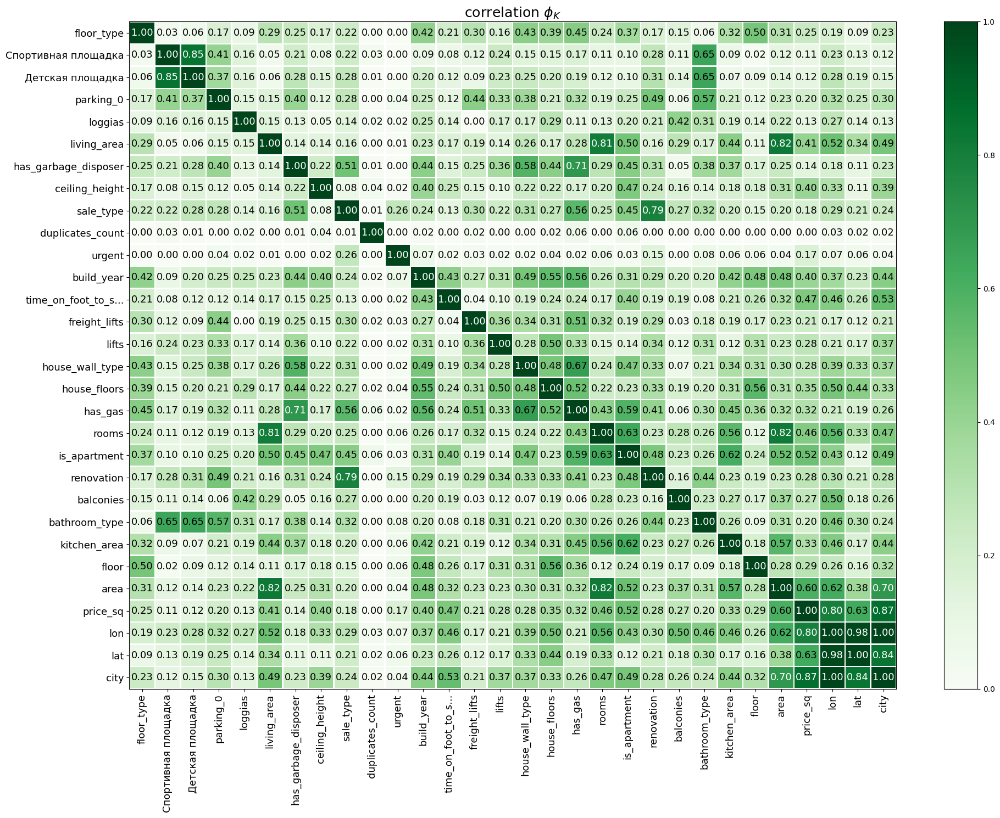

In [139]:
phik_overview = df.phik_matrix()
#phik_overview.round(2)

plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.3, 
                        figsize=(20, 15))
plt.tight_layout()

Видим, что стоимость квадратного метра коррелириует с местоположением (долгота и широта), городом, общей площадью, количеством комнат, удаленности от метро, жилой площади, типа стен дома, высоты потолков, этажности дома, годом постройки здания, площадью кухни и т.д.

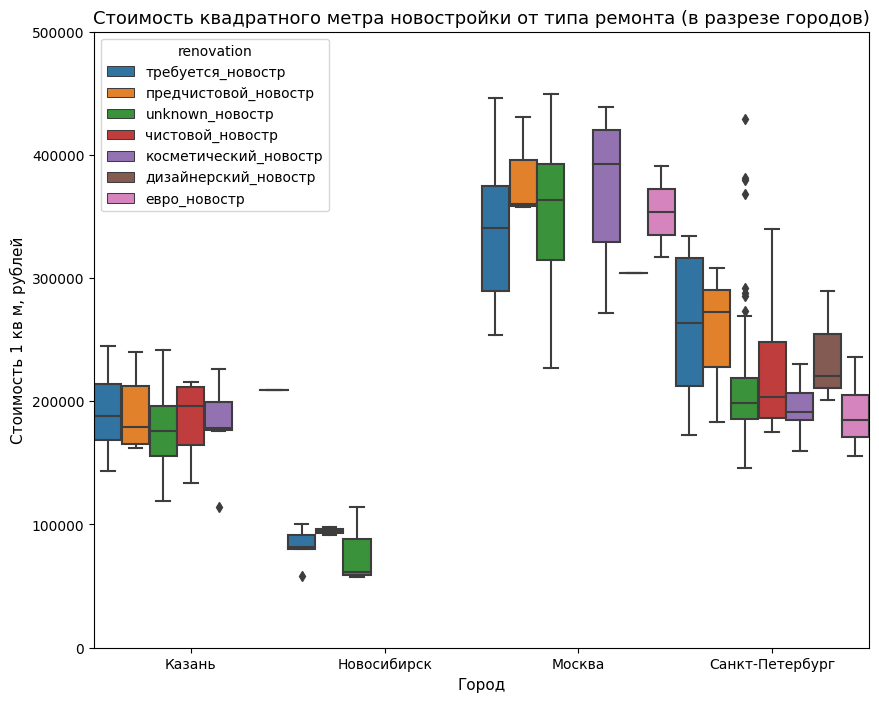

In [140]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов
cities = ['Казань','Москва','Санкт-Петербург','Новосибирск'] #'Казань','Москва','Санкт-Петербург','Новосибирск'
new_house = ['Переуступка', 'Первичная продажа'] #, 'Продажа от застройщика'
plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    #data = df.query('city in @cities'),
    data = df.query('city in @cities and sale_type in @new_house'),
    width= 1,
    #notch= True,
    hue='renovation')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 500000)
plt.title("Стоимость квадратного метра новостройки от типа ремонта (в разрезе городов)", fontsize= 13)
plt.show()

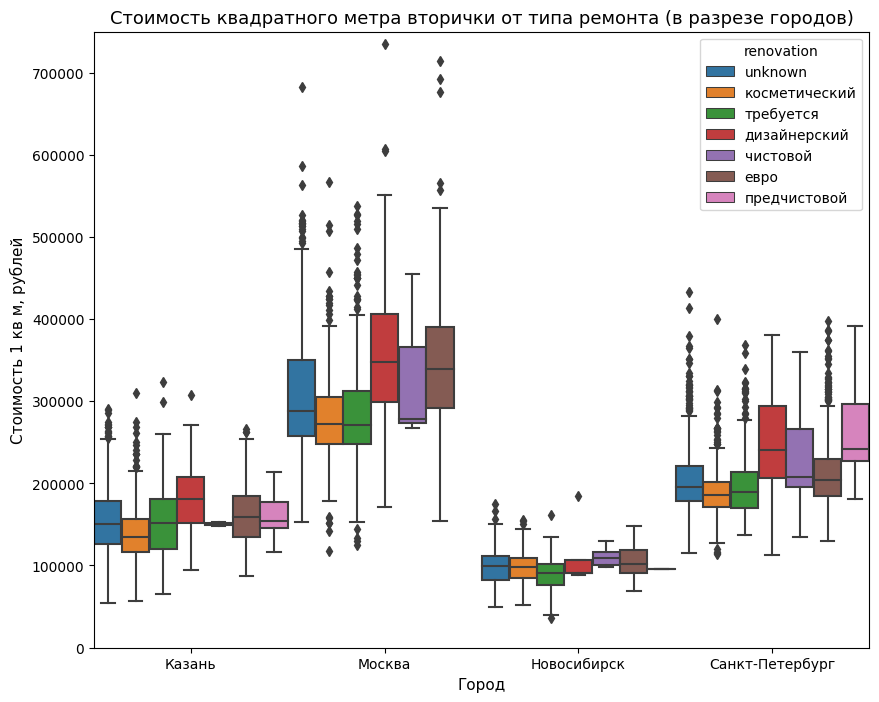

In [141]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов
cities = ['Казань','Москва','Санкт-Петербург','Новосибирск']
new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city in @cities and sale_type not in @new_house'), 
    width= 1,
    #notch= True,
    hue='renovation')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 750000)
plt.title("Стоимость квадратного метра вторички от типа ремонта (в разрезе городов)", fontsize= 13)
plt.show()

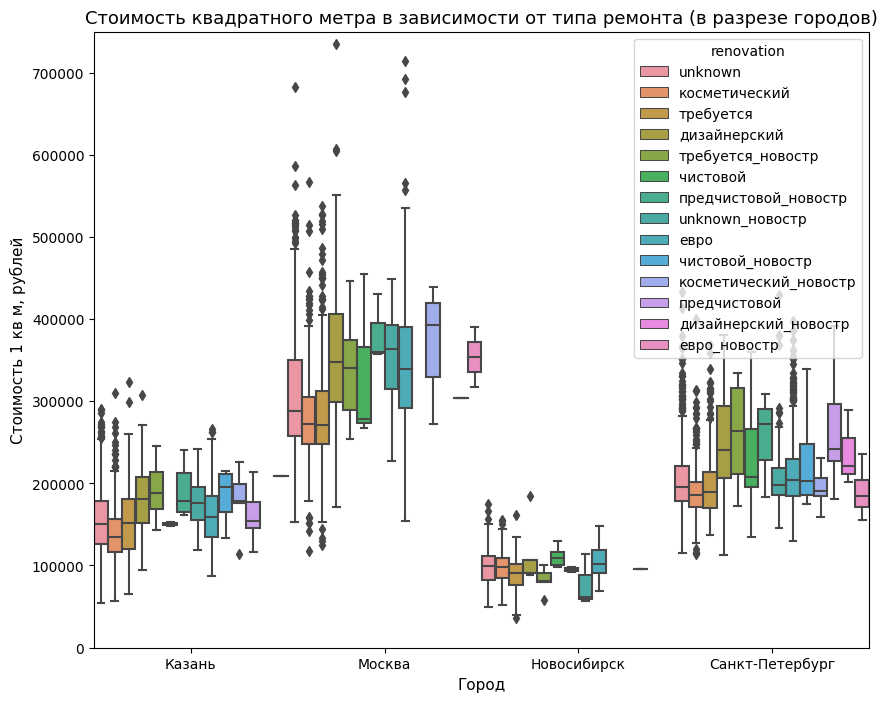

In [142]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов

plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city in @cities'), 
    width= 1,
    #notch= True,
    hue='renovation')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 750000)
plt.title("Стоимость квадратного метра в зависимости от типа ремонта (в разрезе городов)", fontsize= 13)
plt.show()

<Figure size 1000x800 with 0 Axes>

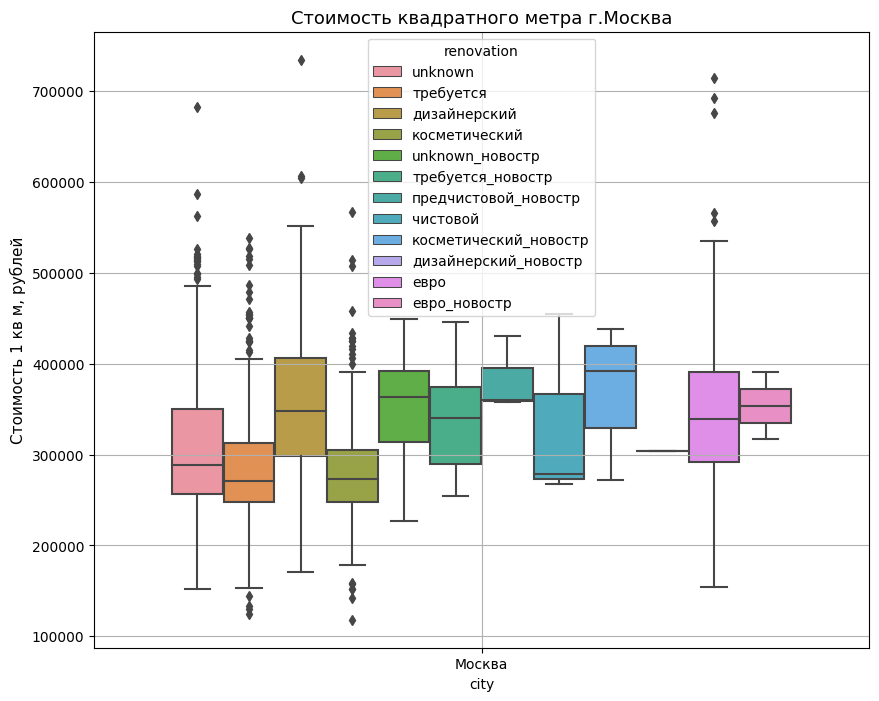

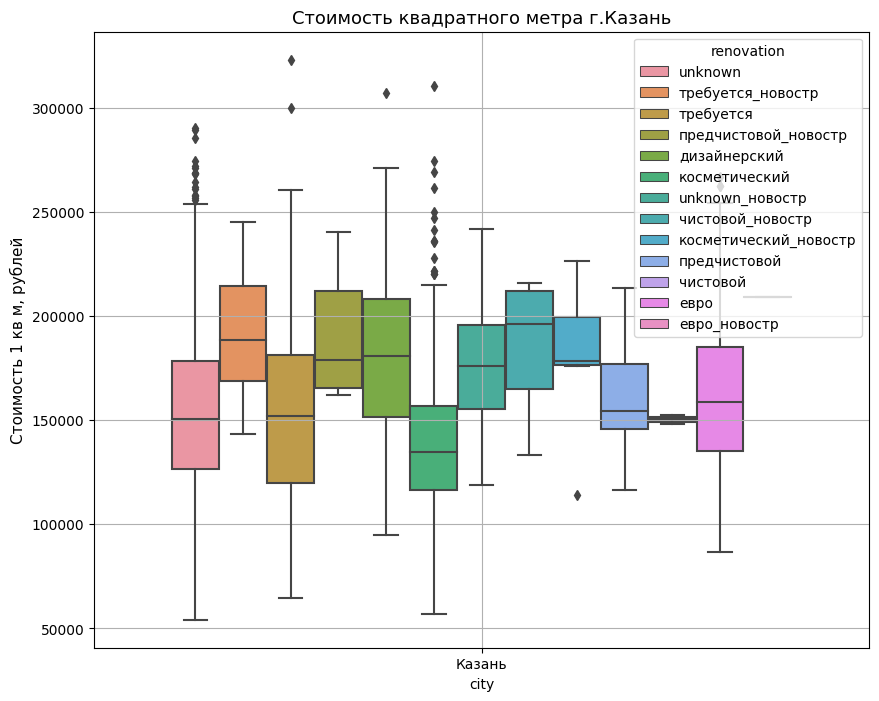

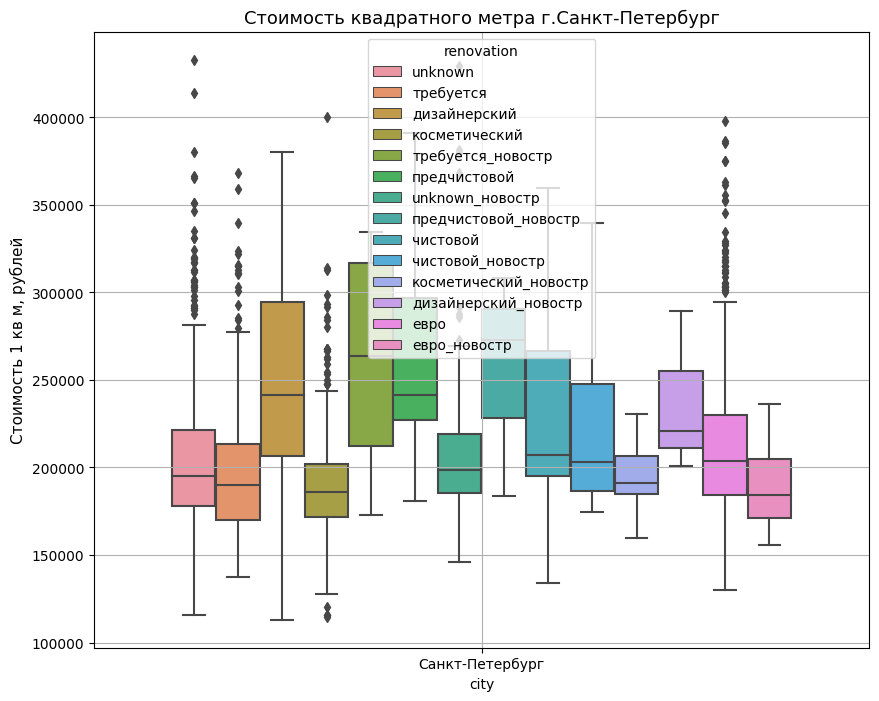

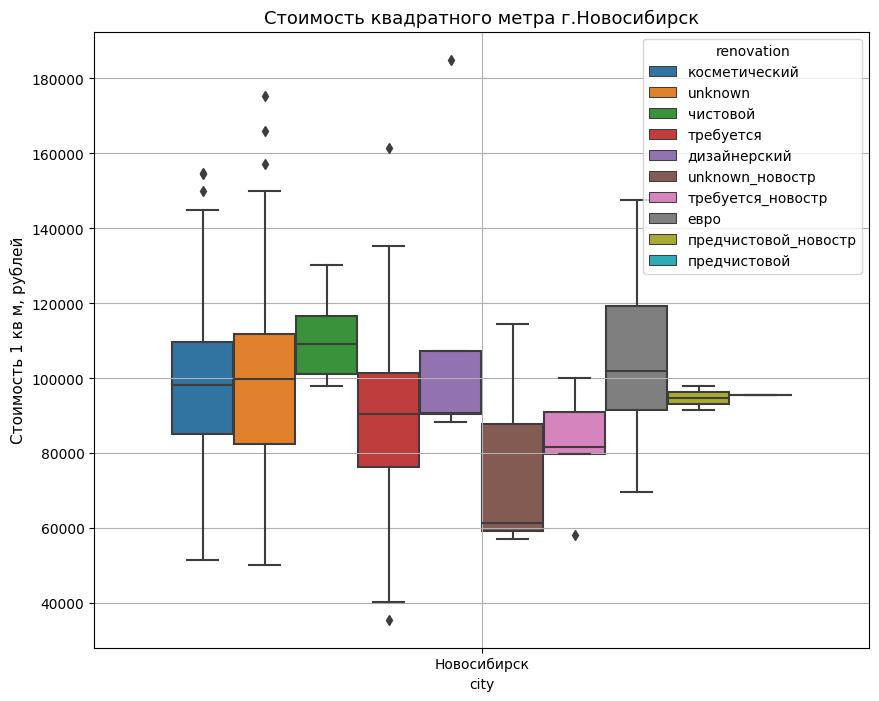

''

In [143]:
#построим график зависимости стоимости квадратного метра от вида ремонта в разрезе городов
cities = ['Москва','Казань','Санкт-Петербург','Новосибирск']
#new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))

for city in cities:
    plt.figure(figsize=(10, 8))
    box_plot = sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city == @city'), 
    width= 0.8, #palette="Set2",
    #notch= True,
    hue='renovation')

    plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    #plt.ylim(0, 700000)
    plt.title("Стоимость квадратного метра г."+city, fontsize= 13)
    box_plot.grid()

    plt.show()
;

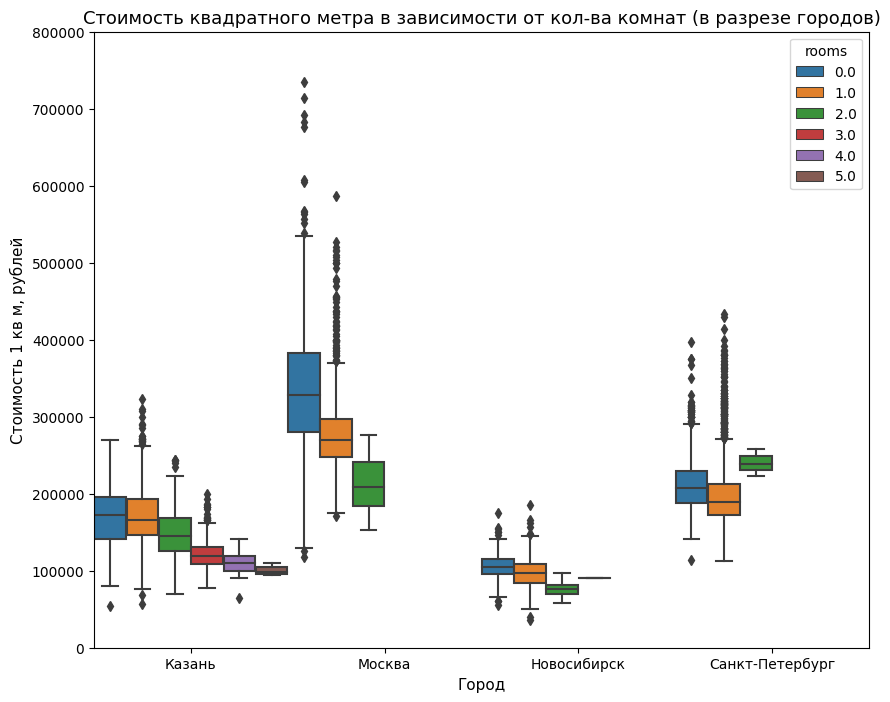

In [144]:
#построим график зависимости стоимости квадратного метра от количества комнат в разрезе городов
plt.figure(figsize=(10, 8))
sns.boxplot(
    y='price_sq', x='city', 
    data = df.query('city in @cities'), 
    width= 1,
    #notch= True,
    hue='rooms')
plt.xlabel("Город", fontsize= 11)
plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
plt.ylim(0, 800000)
plt.title("Стоимость квадратного метра в зависимости от кол-ва комнат (в разрезе городов)", fontsize= 13)
plt.show()

## Обучение моделей

### Выделим признаки, разделим на выборки

In [145]:
# подготовим признаки для моделей
features = df.drop(['price_sq'], axis=1)
target = df['price_sq']

In [146]:
#разобьем данные на выборки
features_train, features_test, target_train, target_test = train_test_split(features, target, 
                                                                            test_size=0.2, 
                                                                            random_state=12345) 

In [148]:
# перечислим количественные признаки
#num_features = features_train.select_dtypes(include='float64').columns.to_list() #- ['floor']
num_features = ['lat', 'lon', 'area', 'floor', 'kitchen_area', 'balconies', 
                'rooms', 'house_floors', 'build_year', 'lifts', 'freight_lifts', 
                'time_on_foot_to_subway', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias',
               'Детская площадка', 'Спортивная площадка']#, 'Торговый центр', 'Парк', 'Детский сад', 'Фитнес', 'Школа']

#del num_features[6:8]
print(num_features)

# перечислим качественные признаки
#cat_features = features_train.select_dtypes(exclude=['float64']).columns.to_list() #+ ['floor']
cat_features = ['city', 'bathroom_type', 'renovation', 'is_apartment', 'has_gas', 'house_wall_type', 
                'sale_type', 'has_garbage_disposer', 'parking_0', 'floor_type'] #'yard_0', 'yard_1']
        
print(cat_features)

['lat', 'lon', 'area', 'floor', 'kitchen_area', 'balconies', 'rooms', 'house_floors', 'build_year', 'lifts', 'freight_lifts', 'time_on_foot_to_subway', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias', 'Детская площадка', 'Спортивная площадка']
['city', 'bathroom_type', 'renovation', 'is_apartment', 'has_gas', 'house_wall_type', 'sale_type', 'has_garbage_disposer', 'parking_0', 'floor_type']


### CatBoostRegressor

In [149]:
train_pool = Pool(features_train, target_train, cat_features=cat_features)
test_pool = Pool(features_test, target_test, cat_features=cat_features)

In [150]:
'''
%%time
# без гридсерч и кросс-валидации
model_cat_ = CatBoostRegressor(iterations=500, depth=10, learning_rate=0.01, loss_function='MAE', silent=False)
model_cat_.fit(train_pool, eval_set=test_pool)

print('catb train mae: %g' % (mean_absolute_error(target_train, model_cat_.predict(train_pool))))
#test_score = (mean_squared_error(target_test, model_cat.predict(test_pool)))**0.5
#print('catb test rmse: %g' % test_score)
'''

"\n%%time\n# без гридсерч и кросс-валидации\nmodel_cat_ = CatBoostRegressor(iterations=500, depth=10, learning_rate=0.01, loss_function='MAE', silent=False)\nmodel_cat_.fit(train_pool, eval_set=test_pool)\n\nprint('catb train mae: %g' % (mean_absolute_error(target_train, model_cat_.predict(train_pool))))\n#test_score = (mean_squared_error(target_test, model_cat.predict(test_pool)))**0.5\n#print('catb test rmse: %g' % test_score)\n"

r2_score(target_train, model_cat_.predict(train_pool))

In [151]:
%%time
catboost = CatBoostRegressor(loss_function='MAE')

parameters_cat = {'depth': [5, 7, 10], 
                  'learning_rate': [0.05], #np.arange(0.05,0.5, 0.15),
                  'iterations': [100, 300, 500]} #np.arange(0.1,1,0.2)

catboost_grid = catboost.grid_search(parameters_cat,
            train_pool,
            cv=4,
            verbose=100,
            plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 191154.0131812	test: 188052.3646372	best: 188052.3646372 (0)	total: 77ms	remaining: 7.62s
1:	learn: 181980.9843906	test: 178914.5215002	best: 178914.5215002 (1)	total: 103ms	remaining: 5.02s
2:	learn: 173268.8206716	test: 170174.7293310	best: 170174.7293310 (2)	total: 130ms	remaining: 4.2s
3:	learn: 165365.2522345	test: 162241.6653682	best: 162241.6653682 (3)	total: 150ms	remaining: 3.6s
4:	learn: 157675.7308937	test: 154602.4896210	best: 154602.4896210 (4)	total: 175ms	remaining: 3.33s
5:	learn: 150723.8915758	test: 147653.2679047	best: 147653.2679047 (5)	total: 182ms	remaining: 2.86s
6:	learn: 143725.6873870	test: 140773.9362103	best: 140773.9362103 (6)	total: 208ms	remaining: 2.77s
7:	learn: 137005.5948058	test: 134139.3160950	best: 134139.3160950 (7)	total: 232ms	remaining: 2.67s
8:	learn: 130927.3509793	test: 128112.0118523	best: 128112.0118523 (8)	total: 259ms	remaining: 2.61s
9:	learn: 124862.5468937	test: 122035.3358184	best: 122035.3358184 (9)	total: 282ms	remaining:

84:	learn: 26051.5742977	test: 26399.6091790	best: 26399.6091790 (84)	total: 1.82s	remaining: 322ms
85:	learn: 25939.1685177	test: 26297.3539595	best: 26297.3539595 (85)	total: 1.84s	remaining: 300ms
86:	learn: 25865.9187635	test: 26231.7971113	best: 26231.7971113 (86)	total: 1.86s	remaining: 278ms
87:	learn: 25786.0776070	test: 26166.1933257	best: 26166.1933257 (87)	total: 1.88s	remaining: 256ms
88:	learn: 25728.7226114	test: 26121.8998579	best: 26121.8998579 (88)	total: 1.9s	remaining: 235ms
89:	learn: 25656.1833790	test: 26060.7967923	best: 26060.7967923 (89)	total: 1.92s	remaining: 213ms
90:	learn: 25579.7065889	test: 25983.3114155	best: 25983.3114155 (90)	total: 1.94s	remaining: 192ms
91:	learn: 25533.5319695	test: 25941.6428924	best: 25941.6428924 (91)	total: 1.96s	remaining: 170ms
92:	learn: 25468.8751883	test: 25891.0168721	best: 25891.0168721 (92)	total: 1.98s	remaining: 149ms
93:	learn: 25407.0083974	test: 25822.8081617	best: 25822.8081617 (93)	total: 2s	remaining: 128ms
94:	

65:	learn: 27948.5789963	test: 27808.2938533	best: 27808.2938533 (65)	total: 1.5s	remaining: 5.33s
66:	learn: 27844.7137614	test: 27711.6092053	best: 27711.6092053 (66)	total: 1.53s	remaining: 5.32s
67:	learn: 27690.6346176	test: 27601.0218223	best: 27601.0218223 (67)	total: 1.55s	remaining: 5.3s
68:	learn: 27535.2858916	test: 27481.9735879	best: 27481.9735879 (68)	total: 1.58s	remaining: 5.29s
69:	learn: 27405.0006520	test: 27388.4534279	best: 27388.4534279 (69)	total: 1.6s	remaining: 5.28s
70:	learn: 27268.9321933	test: 27289.6285887	best: 27289.6285887 (70)	total: 1.63s	remaining: 5.25s
71:	learn: 27151.4190192	test: 27185.9990070	best: 27185.9990070 (71)	total: 1.65s	remaining: 5.22s
72:	learn: 26987.7159998	test: 27057.8118904	best: 27057.8118904 (72)	total: 1.67s	remaining: 5.2s
73:	learn: 26923.5942785	test: 26996.3785665	best: 26996.3785665 (73)	total: 1.69s	remaining: 5.17s
74:	learn: 26851.5313760	test: 26937.9668120	best: 26937.9668120 (74)	total: 1.72s	remaining: 5.15s
75:	

148:	learn: 22842.2338781	test: 23526.3332616	best: 23526.3332616 (148)	total: 3.39s	remaining: 3.44s
149:	learn: 22833.3921998	test: 23521.8312595	best: 23521.8312595 (149)	total: 3.42s	remaining: 3.42s
150:	learn: 22807.9374693	test: 23503.7667620	best: 23503.7667620 (150)	total: 3.44s	remaining: 3.4s
151:	learn: 22786.9393070	test: 23482.9098442	best: 23482.9098442 (151)	total: 3.47s	remaining: 3.38s
152:	learn: 22754.5712657	test: 23448.7201629	best: 23448.7201629 (152)	total: 3.49s	remaining: 3.35s
153:	learn: 22719.7021049	test: 23444.7039888	best: 23444.7039888 (153)	total: 3.51s	remaining: 3.33s
154:	learn: 22666.0525000	test: 23412.4617187	best: 23412.4617187 (154)	total: 3.53s	remaining: 3.31s
155:	learn: 22633.0512995	test: 23402.8681528	best: 23402.8681528 (155)	total: 3.55s	remaining: 3.28s
156:	learn: 22603.0003381	test: 23393.8542588	best: 23393.8542588 (156)	total: 3.58s	remaining: 3.26s
157:	learn: 22569.2264140	test: 23366.0980988	best: 23366.0980988 (157)	total: 3.6s

236:	learn: 20214.0539862	test: 21558.8918936	best: 21558.8918936 (236)	total: 5.36s	remaining: 1.42s
237:	learn: 20190.5221287	test: 21545.7779227	best: 21545.7779227 (237)	total: 5.38s	remaining: 1.4s
238:	learn: 20178.9462422	test: 21537.7054987	best: 21537.7054987 (238)	total: 5.4s	remaining: 1.38s
239:	learn: 20163.2383797	test: 21518.0241173	best: 21518.0241173 (239)	total: 5.42s	remaining: 1.36s
240:	learn: 20146.5845497	test: 21504.4373275	best: 21504.4373275 (240)	total: 5.45s	remaining: 1.33s
241:	learn: 20113.8236292	test: 21466.0168112	best: 21466.0168112 (241)	total: 5.47s	remaining: 1.31s
242:	learn: 20100.7432801	test: 21456.1429250	best: 21456.1429250 (242)	total: 5.49s	remaining: 1.29s
243:	learn: 20078.8515483	test: 21446.5217751	best: 21446.5217751 (243)	total: 5.51s	remaining: 1.26s
244:	learn: 20043.0923648	test: 21402.0317636	best: 21402.0317636 (244)	total: 5.53s	remaining: 1.24s
245:	learn: 20024.0663058	test: 21388.9471839	best: 21388.9471839 (245)	total: 5.56s

23:	learn: 69391.1706240	test: 66987.4183695	best: 66987.4183695 (23)	total: 522ms	remaining: 10.3s
24:	learn: 66966.6721655	test: 64500.2202784	best: 64500.2202784 (24)	total: 544ms	remaining: 10.3s
25:	learn: 64845.4203226	test: 62374.7980733	best: 62374.7980733 (25)	total: 565ms	remaining: 10.3s
26:	learn: 62850.1080924	test: 60379.7506060	best: 60379.7506060 (26)	total: 587ms	remaining: 10.3s
27:	learn: 60613.8032729	test: 58229.2277975	best: 58229.2277975 (27)	total: 609ms	remaining: 10.3s
28:	learn: 58581.2072364	test: 56233.3295656	best: 56233.3295656 (28)	total: 635ms	remaining: 10.3s
29:	learn: 56508.3321671	test: 54247.9333641	best: 54247.9333641 (29)	total: 659ms	remaining: 10.3s
30:	learn: 54755.0826570	test: 52532.5216184	best: 52532.5216184 (30)	total: 680ms	remaining: 10.3s
31:	learn: 52981.2711386	test: 50858.6696008	best: 50858.6696008 (31)	total: 701ms	remaining: 10.3s
32:	learn: 51364.4083242	test: 49307.5722932	best: 49307.5722932 (32)	total: 723ms	remaining: 10.2s


111:	learn: 24295.6445525	test: 24657.0064904	best: 24657.0064904 (111)	total: 2.48s	remaining: 8.6s
112:	learn: 24227.9855759	test: 24605.7417482	best: 24605.7417482 (112)	total: 2.51s	remaining: 8.58s
113:	learn: 24191.4074980	test: 24567.9459533	best: 24567.9459533 (113)	total: 2.53s	remaining: 8.56s
114:	learn: 24121.9981803	test: 24527.4478956	best: 24527.4478956 (114)	total: 2.55s	remaining: 8.53s
115:	learn: 24099.3150530	test: 24518.9810255	best: 24518.9810255 (115)	total: 2.57s	remaining: 8.51s
116:	learn: 24050.9297034	test: 24492.1040703	best: 24492.1040703 (116)	total: 2.59s	remaining: 8.49s
117:	learn: 24032.5879328	test: 24477.8114142	best: 24477.8114142 (117)	total: 2.61s	remaining: 8.46s
118:	learn: 23972.8932574	test: 24429.5792956	best: 24429.5792956 (118)	total: 2.64s	remaining: 8.44s
119:	learn: 23919.9421821	test: 24384.2230666	best: 24384.2230666 (119)	total: 2.66s	remaining: 8.42s
120:	learn: 23883.2420336	test: 24351.6256523	best: 24351.6256523 (120)	total: 2.68

199:	learn: 21215.5527787	test: 22281.1478414	best: 22281.1478414 (199)	total: 4.46s	remaining: 6.7s
200:	learn: 21174.8375532	test: 22247.9242080	best: 22247.9242080 (200)	total: 4.49s	remaining: 6.68s
201:	learn: 21136.9928153	test: 22229.2036638	best: 22229.2036638 (201)	total: 4.52s	remaining: 6.66s
202:	learn: 21115.0410185	test: 22216.7067878	best: 22216.7067878 (202)	total: 4.54s	remaining: 6.64s
203:	learn: 21075.7341388	test: 22186.5073928	best: 22186.5073928 (203)	total: 4.56s	remaining: 6.62s
204:	learn: 21045.4287295	test: 22169.6659877	best: 22169.6659877 (204)	total: 4.58s	remaining: 6.59s
205:	learn: 21012.0266405	test: 22153.7905042	best: 22153.7905042 (205)	total: 4.61s	remaining: 6.58s
206:	learn: 20977.2562289	test: 22133.2703560	best: 22133.2703560 (206)	total: 4.63s	remaining: 6.56s
207:	learn: 20963.6122567	test: 22120.2427009	best: 22120.2427009 (207)	total: 4.65s	remaining: 6.53s
208:	learn: 20947.2177003	test: 22115.0410347	best: 22115.0410347 (208)	total: 4.68

284:	learn: 19392.6731558	test: 20945.1114362	best: 20945.1114362 (284)	total: 6.38s	remaining: 4.81s
285:	learn: 19384.3490974	test: 20942.2435999	best: 20942.2435999 (285)	total: 6.41s	remaining: 4.79s
286:	learn: 19363.1193647	test: 20927.3003754	best: 20927.3003754 (286)	total: 6.43s	remaining: 4.77s
287:	learn: 19337.9891466	test: 20915.3244665	best: 20915.3244665 (287)	total: 6.45s	remaining: 4.75s
288:	learn: 19328.2057700	test: 20907.3063637	best: 20907.3063637 (288)	total: 6.47s	remaining: 4.72s
289:	learn: 19322.4421232	test: 20906.3319642	best: 20906.3319642 (289)	total: 6.49s	remaining: 4.7s
290:	learn: 19300.9418199	test: 20880.7168749	best: 20880.7168749 (290)	total: 6.51s	remaining: 4.68s
291:	learn: 19291.9856300	test: 20875.3758766	best: 20875.3758766 (291)	total: 6.54s	remaining: 4.66s
292:	learn: 19271.0113343	test: 20855.3876433	best: 20855.3876433 (292)	total: 6.56s	remaining: 4.63s
293:	learn: 19258.0683857	test: 20848.6121811	best: 20848.6121811 (293)	total: 6.58

365:	learn: 18422.1128979	test: 20352.0128762	best: 20352.0128762 (365)	total: 8.2s	remaining: 3s
366:	learn: 18382.7574933	test: 20311.5292782	best: 20311.5292782 (366)	total: 8.23s	remaining: 2.98s
367:	learn: 18375.3152755	test: 20308.7106662	best: 20308.7106662 (367)	total: 8.25s	remaining: 2.96s
368:	learn: 18372.5795629	test: 20306.5624211	best: 20306.5624211 (368)	total: 8.27s	remaining: 2.94s
369:	learn: 18365.7605892	test: 20302.8605910	best: 20302.8605910 (369)	total: 8.29s	remaining: 2.91s
370:	learn: 18358.4365001	test: 20298.8154626	best: 20298.8154626 (370)	total: 8.32s	remaining: 2.89s
371:	learn: 18353.2620300	test: 20294.5933669	best: 20294.5933669 (371)	total: 8.34s	remaining: 2.87s
372:	learn: 18348.8971674	test: 20292.2425809	best: 20292.2425809 (372)	total: 8.36s	remaining: 2.85s
373:	learn: 18343.0965650	test: 20291.8951565	best: 20291.8951565 (373)	total: 8.38s	remaining: 2.82s
374:	learn: 18329.8868187	test: 20286.7686970	best: 20286.7686970 (374)	total: 8.4s	re

451:	learn: 17707.3637677	test: 19864.4656007	best: 19864.4656007 (451)	total: 10.1s	remaining: 1.08s
452:	learn: 17702.8491813	test: 19863.1345475	best: 19863.1345475 (452)	total: 10.2s	remaining: 1.05s
453:	learn: 17688.6707705	test: 19850.6583064	best: 19850.6583064 (453)	total: 10.2s	remaining: 1.03s
454:	learn: 17685.6265776	test: 19848.3192872	best: 19848.3192872 (454)	total: 10.2s	remaining: 1.01s
455:	learn: 17679.4171386	test: 19846.6161463	best: 19846.6161463 (455)	total: 10.2s	remaining: 987ms
456:	learn: 17670.9659268	test: 19840.7745798	best: 19840.7745798 (456)	total: 10.2s	remaining: 964ms
457:	learn: 17668.7904989	test: 19838.3337339	best: 19838.3337339 (457)	total: 10.3s	remaining: 942ms
458:	learn: 17666.2467244	test: 19838.6037302	best: 19838.3337339 (457)	total: 10.3s	remaining: 919ms
459:	learn: 17658.4359823	test: 19839.3844639	best: 19838.3337339 (457)	total: 10.3s	remaining: 897ms
460:	learn: 17653.0357853	test: 19831.8252023	best: 19831.8252023 (460)	total: 10.

37:	learn: 44816.3625143	test: 43165.8321860	best: 43165.8321860 (37)	total: 997ms	remaining: 1.63s
38:	learn: 43633.8571921	test: 42093.0443307	best: 42093.0443307 (38)	total: 1.02s	remaining: 1.6s
39:	learn: 42586.1977388	test: 41098.2288378	best: 41098.2288378 (39)	total: 1.05s	remaining: 1.58s
40:	learn: 41480.2108212	test: 40078.4082540	best: 40078.4082540 (40)	total: 1.08s	remaining: 1.56s
41:	learn: 40388.3864344	test: 39074.3120786	best: 39074.3120786 (41)	total: 1.11s	remaining: 1.53s
42:	learn: 39564.1582928	test: 38312.3981704	best: 38312.3981704 (42)	total: 1.14s	remaining: 1.51s
43:	learn: 38679.4852587	test: 37527.2245078	best: 37527.2245078 (43)	total: 1.16s	remaining: 1.48s
44:	learn: 37779.8635415	test: 36671.9039269	best: 36671.9039269 (44)	total: 1.19s	remaining: 1.46s
45:	learn: 37038.5186830	test: 35934.6582998	best: 35934.6582998 (45)	total: 1.22s	remaining: 1.44s
46:	learn: 36190.8659075	test: 35215.1384218	best: 35215.1384218 (46)	total: 1.25s	remaining: 1.41s
4

25:	learn: 65656.0517495	test: 63154.7297711	best: 63154.7297711 (25)	total: 694ms	remaining: 7.32s
26:	learn: 63000.8447158	test: 60564.7228572	best: 60564.7228572 (26)	total: 730ms	remaining: 7.38s
27:	learn: 60576.9811849	test: 58273.5891714	best: 58273.5891714 (27)	total: 763ms	remaining: 7.41s
28:	learn: 58445.4187574	test: 56259.9509757	best: 56259.9509757 (28)	total: 798ms	remaining: 7.46s
29:	learn: 56410.0256241	test: 54319.1744732	best: 54319.1744732 (29)	total: 831ms	remaining: 7.48s
30:	learn: 54894.4089643	test: 52880.5293451	best: 52880.5293451 (30)	total: 845ms	remaining: 7.33s
31:	learn: 52872.4257220	test: 51010.5824204	best: 51010.5824204 (31)	total: 876ms	remaining: 7.34s
32:	learn: 51164.7979265	test: 49441.2283741	best: 49441.2283741 (32)	total: 910ms	remaining: 7.36s
33:	learn: 49485.6376058	test: 47819.8260132	best: 47819.8260132 (33)	total: 944ms	remaining: 7.38s
34:	learn: 47899.0564784	test: 46280.7150263	best: 46280.7150263 (34)	total: 976ms	remaining: 7.39s


113:	learn: 21988.7946310	test: 23659.5450121	best: 23659.5450121 (113)	total: 3.59s	remaining: 5.85s
114:	learn: 21921.5602933	test: 23624.5305804	best: 23624.5305804 (114)	total: 3.62s	remaining: 5.82s
115:	learn: 21867.3874046	test: 23591.4540044	best: 23591.4540044 (115)	total: 3.65s	remaining: 5.79s
116:	learn: 21826.0847118	test: 23559.7224011	best: 23559.7224011 (116)	total: 3.69s	remaining: 5.77s
117:	learn: 21799.6012089	test: 23547.6026147	best: 23547.6026147 (117)	total: 3.72s	remaining: 5.74s
118:	learn: 21734.3645931	test: 23477.2469237	best: 23477.2469237 (118)	total: 3.75s	remaining: 5.71s
119:	learn: 21693.5005778	test: 23443.1317205	best: 23443.1317205 (119)	total: 3.78s	remaining: 5.68s
120:	learn: 21675.0077016	test: 23431.5708872	best: 23431.5708872 (120)	total: 3.82s	remaining: 5.65s
121:	learn: 21640.2037468	test: 23404.1712842	best: 23404.1712842 (121)	total: 3.85s	remaining: 5.62s
122:	learn: 21588.7656491	test: 23356.9856163	best: 23356.9856163 (122)	total: 3.8

195:	learn: 18938.0257460	test: 21480.9386380	best: 21480.9386380 (195)	total: 6.33s	remaining: 3.36s
196:	learn: 18857.8838821	test: 21416.9255587	best: 21416.9255587 (196)	total: 6.37s	remaining: 3.33s
197:	learn: 18808.5765693	test: 21398.6563643	best: 21398.6563643 (197)	total: 6.4s	remaining: 3.3s
198:	learn: 18787.9553751	test: 21393.3444073	best: 21393.3444073 (198)	total: 6.43s	remaining: 3.26s
199:	learn: 18749.4912947	test: 21347.4578018	best: 21347.4578018 (199)	total: 6.46s	remaining: 3.23s
200:	learn: 18707.0507939	test: 21311.1966178	best: 21311.1966178 (200)	total: 6.5s	remaining: 3.2s
201:	learn: 18674.1133891	test: 21302.4014364	best: 21302.4014364 (201)	total: 6.53s	remaining: 3.17s
202:	learn: 18659.4610461	test: 21299.8497978	best: 21299.8497978 (202)	total: 6.58s	remaining: 3.14s
203:	learn: 18606.9470641	test: 21270.9956573	best: 21270.9956573 (203)	total: 6.62s	remaining: 3.11s
204:	learn: 18560.3171886	test: 21219.4468007	best: 21219.4468007 (204)	total: 6.65s	r

279:	learn: 16588.0735609	test: 20059.2524362	best: 20059.2524362 (279)	total: 9.17s	remaining: 655ms
280:	learn: 16580.3688982	test: 20057.9742201	best: 20057.9742201 (280)	total: 9.2s	remaining: 622ms
281:	learn: 16556.1095787	test: 20042.0642816	best: 20042.0642816 (281)	total: 9.24s	remaining: 590ms
282:	learn: 16537.1775770	test: 20063.5587489	best: 20042.0642816 (281)	total: 9.27s	remaining: 557ms
283:	learn: 16518.2302249	test: 20057.1340733	best: 20042.0642816 (281)	total: 9.3s	remaining: 524ms
284:	learn: 16511.4434160	test: 20054.2421388	best: 20042.0642816 (281)	total: 9.34s	remaining: 491ms
285:	learn: 16488.0646954	test: 20040.0171013	best: 20040.0171013 (285)	total: 9.37s	remaining: 459ms
286:	learn: 16482.6610069	test: 20038.3554019	best: 20038.3554019 (286)	total: 9.41s	remaining: 426ms
287:	learn: 16467.8075450	test: 20031.3058562	best: 20031.3058562 (287)	total: 9.44s	remaining: 393ms
288:	learn: 16464.0382601	test: 20030.1831787	best: 20030.1831787 (288)	total: 9.47s

60:	learn: 28747.5894454	test: 28792.9612887	best: 28792.9612887 (60)	total: 1.76s	remaining: 12.7s
61:	learn: 28379.3192048	test: 28497.2019661	best: 28497.2019661 (61)	total: 1.8s	remaining: 12.7s
62:	learn: 28046.0579220	test: 28213.9816811	best: 28213.9816811 (62)	total: 1.83s	remaining: 12.7s
63:	learn: 27816.0743447	test: 27997.9769894	best: 27997.9769894 (63)	total: 1.86s	remaining: 12.7s
64:	learn: 27447.4501463	test: 27701.0181324	best: 27701.0181324 (64)	total: 1.89s	remaining: 12.7s
65:	learn: 27277.7592628	test: 27544.8744696	best: 27544.8744696 (65)	total: 1.92s	remaining: 12.6s
66:	learn: 27041.6978477	test: 27377.6825000	best: 27377.6825000 (66)	total: 1.96s	remaining: 12.6s
67:	learn: 26794.4802300	test: 27168.8722269	best: 27168.8722269 (67)	total: 1.99s	remaining: 12.7s
68:	learn: 26658.4405966	test: 27055.5667050	best: 27055.5667050 (68)	total: 2.02s	remaining: 12.6s
69:	learn: 26351.4609178	test: 26812.4536855	best: 26812.4536855 (69)	total: 2.06s	remaining: 12.7s
7

146:	learn: 20528.0594734	test: 22627.4703009	best: 22627.4703009 (146)	total: 4.65s	remaining: 11.2s
147:	learn: 20501.9254165	test: 22616.8562122	best: 22616.8562122 (147)	total: 4.68s	remaining: 11.1s
148:	learn: 20441.8800703	test: 22571.0916530	best: 22571.0916530 (148)	total: 4.72s	remaining: 11.1s
149:	learn: 20414.0515223	test: 22550.5639879	best: 22550.5639879 (149)	total: 4.75s	remaining: 11.1s
150:	learn: 20359.9892728	test: 22513.5528937	best: 22513.5528937 (150)	total: 4.78s	remaining: 11.1s
151:	learn: 20338.8302004	test: 22485.1411764	best: 22485.1411764 (151)	total: 4.82s	remaining: 11s
152:	learn: 20315.1793761	test: 22468.9383571	best: 22468.9383571 (152)	total: 4.85s	remaining: 11s
153:	learn: 20272.8168073	test: 22441.2202816	best: 22441.2202816 (153)	total: 4.88s	remaining: 11s
154:	learn: 20247.5925713	test: 22426.2764323	best: 22426.2764323 (154)	total: 4.92s	remaining: 10.9s
155:	learn: 20211.1675789	test: 22388.9630515	best: 22388.9630515 (155)	total: 4.95s	rem

230:	learn: 17716.2115359	test: 20666.1719987	best: 20666.1719987 (230)	total: 7.54s	remaining: 8.79s
231:	learn: 17684.3360405	test: 20636.9556424	best: 20636.9556424 (231)	total: 7.58s	remaining: 8.75s
232:	learn: 17661.0008995	test: 20619.3993804	best: 20619.3993804 (232)	total: 7.61s	remaining: 8.72s
233:	learn: 17644.8187952	test: 20604.3385550	best: 20604.3385550 (233)	total: 7.64s	remaining: 8.69s
234:	learn: 17596.0597823	test: 20578.1951286	best: 20578.1951286 (234)	total: 7.68s	remaining: 8.66s
235:	learn: 17570.9316881	test: 20559.6704533	best: 20559.6704533 (235)	total: 7.72s	remaining: 8.63s
236:	learn: 17549.4938404	test: 20549.4072407	best: 20549.4072407 (236)	total: 7.76s	remaining: 8.61s
237:	learn: 17525.6166970	test: 20532.5804875	best: 20532.5804875 (237)	total: 7.8s	remaining: 8.59s
238:	learn: 17501.4005165	test: 20509.7807474	best: 20509.7807474 (238)	total: 7.83s	remaining: 8.56s
239:	learn: 17449.7103667	test: 20495.8696048	best: 20495.8696048 (239)	total: 7.87

315:	learn: 16103.4904032	test: 19833.4271824	best: 19833.4271824 (315)	total: 10.4s	remaining: 6.07s
316:	learn: 16083.4955113	test: 19832.8061784	best: 19832.8061784 (316)	total: 10.5s	remaining: 6.04s
317:	learn: 16076.5829711	test: 19826.1478693	best: 19826.1478693 (317)	total: 10.5s	remaining: 6.01s
318:	learn: 16063.7910213	test: 19814.7294729	best: 19814.7294729 (318)	total: 10.5s	remaining: 5.97s
319:	learn: 16051.0218814	test: 19816.1570306	best: 19814.7294729 (318)	total: 10.6s	remaining: 5.94s
320:	learn: 16030.4428101	test: 19812.5673567	best: 19812.5673567 (320)	total: 10.6s	remaining: 5.91s
321:	learn: 16025.8518927	test: 19812.2382885	best: 19812.2382885 (321)	total: 10.6s	remaining: 5.88s
322:	learn: 16016.6815220	test: 19808.6604191	best: 19808.6604191 (322)	total: 10.7s	remaining: 5.84s
323:	learn: 16011.3572459	test: 19806.2056514	best: 19806.2056514 (323)	total: 10.7s	remaining: 5.81s
324:	learn: 15999.3440295	test: 19806.0222423	best: 19806.0222423 (324)	total: 10.

402:	learn: 15100.2319756	test: 19385.0363212	best: 19384.6030765 (401)	total: 13.4s	remaining: 3.21s
403:	learn: 15096.5323548	test: 19383.2853261	best: 19383.2853261 (403)	total: 13.4s	remaining: 3.18s
404:	learn: 15093.8365706	test: 19380.8063273	best: 19380.8063273 (404)	total: 13.4s	remaining: 3.15s
405:	learn: 15080.3108953	test: 19375.2008589	best: 19375.2008589 (405)	total: 13.5s	remaining: 3.11s
406:	learn: 15067.9411616	test: 19363.7932856	best: 19363.7932856 (406)	total: 13.5s	remaining: 3.08s
407:	learn: 15059.9989686	test: 19355.2634720	best: 19355.2634720 (407)	total: 13.5s	remaining: 3.05s
408:	learn: 15054.8229443	test: 19355.4597143	best: 19355.2634720 (407)	total: 13.5s	remaining: 3.01s
409:	learn: 15039.1295739	test: 19356.9446940	best: 19355.2634720 (407)	total: 13.6s	remaining: 2.98s
410:	learn: 15015.3648647	test: 19346.5466248	best: 19346.5466248 (410)	total: 13.6s	remaining: 2.95s
411:	learn: 15010.8356062	test: 19346.0840947	best: 19346.0840947 (411)	total: 13.

485:	learn: 14331.6740294	test: 19037.5140007	best: 19033.8361011 (484)	total: 16.1s	remaining: 464ms
486:	learn: 14326.1360603	test: 19037.4993707	best: 19033.8361011 (484)	total: 16.2s	remaining: 431ms
487:	learn: 14311.8626433	test: 19040.6307486	best: 19033.8361011 (484)	total: 16.2s	remaining: 398ms
488:	learn: 14308.4692448	test: 19039.7022227	best: 19033.8361011 (484)	total: 16.2s	remaining: 365ms
489:	learn: 14292.6625497	test: 19032.2690948	best: 19032.2690948 (489)	total: 16.3s	remaining: 332ms
490:	learn: 14275.9441569	test: 19020.6052347	best: 19020.6052347 (490)	total: 16.3s	remaining: 299ms
491:	learn: 14269.4791975	test: 19020.4912452	best: 19020.4912452 (491)	total: 16.3s	remaining: 265ms
492:	learn: 14261.9157401	test: 19018.8842244	best: 19018.8842244 (492)	total: 16.4s	remaining: 232ms
493:	learn: 14249.1524771	test: 19011.8001404	best: 19011.8001404 (493)	total: 16.4s	remaining: 199ms
494:	learn: 14238.9421072	test: 19005.5961453	best: 19005.5961453 (494)	total: 16.

71:	learn: 23090.5352531	test: 25268.6195259	best: 25268.6195259 (71)	total: 3.32s	remaining: 1.29s
72:	learn: 22857.9165401	test: 25074.2982701	best: 25074.2982701 (72)	total: 3.36s	remaining: 1.24s
73:	learn: 22627.2348912	test: 24874.8503619	best: 24874.8503619 (73)	total: 3.42s	remaining: 1.2s
74:	learn: 22409.5328890	test: 24708.7265761	best: 24708.7265761 (74)	total: 3.47s	remaining: 1.16s
75:	learn: 22238.9324233	test: 24575.7877417	best: 24575.7877417 (75)	total: 3.52s	remaining: 1.11s
76:	learn: 22152.9826646	test: 24513.9213456	best: 24513.9213456 (76)	total: 3.54s	remaining: 1.06s
77:	learn: 21958.4277788	test: 24348.8259409	best: 24348.8259409 (77)	total: 3.59s	remaining: 1.01s
78:	learn: 21732.7157861	test: 24205.7135849	best: 24205.7135849 (78)	total: 3.64s	remaining: 968ms
79:	learn: 21591.4725658	test: 24118.0469440	best: 24118.0469440 (79)	total: 3.69s	remaining: 922ms
80:	learn: 21425.8881327	test: 23999.5503976	best: 23999.5503976 (80)	total: 3.74s	remaining: 877ms
8

57:	learn: 28201.2355059	test: 28431.8297164	best: 28431.8297164 (57)	total: 2.38s	remaining: 9.94s
58:	learn: 27833.4347041	test: 28115.4682818	best: 28115.4682818 (58)	total: 2.44s	remaining: 9.96s
59:	learn: 27473.4911773	test: 27839.8281905	best: 27839.8281905 (59)	total: 2.5s	remaining: 9.98s
60:	learn: 27139.4221839	test: 27601.0310014	best: 27601.0310014 (60)	total: 2.55s	remaining: 9.99s
61:	learn: 26808.3564884	test: 27314.9316869	best: 27314.9316869 (61)	total: 2.6s	remaining: 10s
62:	learn: 26453.2139373	test: 27072.0527562	best: 27072.0527562 (62)	total: 2.66s	remaining: 10s
63:	learn: 26139.9722811	test: 26841.6697163	best: 26841.6697163 (63)	total: 2.71s	remaining: 10s
64:	learn: 25791.4480060	test: 26578.4533924	best: 26578.4533924 (64)	total: 2.77s	remaining: 10s
65:	learn: 25407.2841886	test: 26279.6212050	best: 26279.6212050 (65)	total: 2.83s	remaining: 10s
66:	learn: 25174.9065699	test: 26108.7251294	best: 26108.7251294 (66)	total: 2.89s	remaining: 10s
67:	learn: 248

139:	learn: 16567.2271460	test: 21253.0197817	best: 21253.0197817 (139)	total: 7.05s	remaining: 8.06s
140:	learn: 16453.3557825	test: 21199.4569098	best: 21199.4569098 (140)	total: 7.11s	remaining: 8.02s
141:	learn: 16348.3762672	test: 21157.1579595	best: 21157.1579595 (141)	total: 7.17s	remaining: 7.97s
142:	learn: 16292.6535140	test: 21123.7097574	best: 21123.7097574 (142)	total: 7.22s	remaining: 7.93s
143:	learn: 16208.0618423	test: 21109.9362262	best: 21109.9362262 (143)	total: 7.28s	remaining: 7.89s
144:	learn: 16206.7418376	test: 21109.7557984	best: 21109.7557984 (144)	total: 7.29s	remaining: 7.8s
145:	learn: 16158.4354319	test: 21084.6368791	best: 21084.6368791 (145)	total: 7.35s	remaining: 7.75s
146:	learn: 16093.1120868	test: 21049.8456198	best: 21049.8456198 (146)	total: 7.4s	remaining: 7.7s
147:	learn: 16014.5667130	test: 21013.5284505	best: 21013.5284505 (147)	total: 7.46s	remaining: 7.66s
148:	learn: 15954.0848807	test: 20982.8876754	best: 20982.8876754 (148)	total: 7.52s	

220:	learn: 12659.8349191	test: 19695.0278395	best: 19695.0278395 (220)	total: 11.7s	remaining: 4.17s
221:	learn: 12618.8494924	test: 19685.9891469	best: 19685.9891469 (221)	total: 11.7s	remaining: 4.12s
222:	learn: 12602.8479766	test: 19692.6012370	best: 19685.9891469 (221)	total: 11.8s	remaining: 4.07s
223:	learn: 12584.4956720	test: 19693.0447118	best: 19685.9891469 (221)	total: 11.8s	remaining: 4.01s
224:	learn: 12573.5137576	test: 19689.5492129	best: 19685.9891469 (221)	total: 11.9s	remaining: 3.96s
225:	learn: 12543.5347910	test: 19690.2687045	best: 19685.9891469 (221)	total: 11.9s	remaining: 3.91s
226:	learn: 12486.2443777	test: 19656.6564343	best: 19656.6564343 (226)	total: 12s	remaining: 3.86s
227:	learn: 12449.7505498	test: 19651.2439181	best: 19651.2439181 (227)	total: 12.1s	remaining: 3.81s
228:	learn: 12441.0864844	test: 19652.1746414	best: 19651.2439181 (227)	total: 12.1s	remaining: 3.75s
229:	learn: 12423.3125028	test: 19646.1946294	best: 19646.1946294 (229)	total: 12.2s

6:	learn: 143176.0248734	test: 140325.3016090	best: 140325.3016090 (6)	total: 263ms	remaining: 18.5s
7:	learn: 136721.6522770	test: 133918.3839858	best: 133918.3839858 (7)	total: 320ms	remaining: 19.7s
8:	learn: 130755.7072647	test: 127961.8543876	best: 127961.8543876 (8)	total: 324ms	remaining: 17.7s
9:	learn: 125029.5078581	test: 122282.0260068	best: 122282.0260068 (9)	total: 378ms	remaining: 18.5s
10:	learn: 119687.2604936	test: 116764.8750944	best: 116764.8750944 (10)	total: 395ms	remaining: 17.5s
11:	learn: 114408.0853232	test: 111516.4691367	best: 111516.4691367 (11)	total: 450ms	remaining: 18.3s
12:	learn: 109412.2291955	test: 106359.1384905	best: 106359.1384905 (12)	total: 473ms	remaining: 17.7s
13:	learn: 104530.5134663	test: 101353.8457790	best: 101353.8457790 (13)	total: 507ms	remaining: 17.6s
14:	learn: 100339.7275135	test: 97180.1643907	best: 97180.1643907 (14)	total: 528ms	remaining: 17.1s
15:	learn: 96015.4435064	test: 92857.4742871	best: 92857.4742871 (15)	total: 552ms	

91:	learn: 20585.2272698	test: 23150.4578958	best: 23150.4578958 (91)	total: 4.37s	remaining: 19.4s
92:	learn: 20499.1753722	test: 23099.5111537	best: 23099.5111537 (92)	total: 4.42s	remaining: 19.4s
93:	learn: 20375.7034393	test: 23045.6725178	best: 23045.6725178 (93)	total: 4.48s	remaining: 19.4s
94:	learn: 20207.6332995	test: 23005.7927073	best: 23005.7927073 (94)	total: 4.54s	remaining: 19.4s
95:	learn: 20085.8986802	test: 22950.4673810	best: 22950.4673810 (95)	total: 4.6s	remaining: 19.4s
96:	learn: 20024.0363512	test: 22912.5018883	best: 22912.5018883 (96)	total: 4.66s	remaining: 19.4s
97:	learn: 19937.1623732	test: 22839.0531334	best: 22839.0531334 (97)	total: 4.72s	remaining: 19.3s
98:	learn: 19872.3286747	test: 22812.9324089	best: 22812.9324089 (98)	total: 4.77s	remaining: 19.3s
99:	learn: 19799.6016019	test: 22771.4337065	best: 22771.4337065 (99)	total: 4.83s	remaining: 19.3s
100:	learn: 19675.2096185	test: 22708.2569765	best: 22708.2569765 (100)	total: 4.89s	remaining: 19.3s

174:	learn: 14512.4859471	test: 20457.0674534	best: 20457.0674534 (174)	total: 9.01s	remaining: 16.7s
175:	learn: 14483.5503861	test: 20431.5866536	best: 20431.5866536 (175)	total: 9.07s	remaining: 16.7s
176:	learn: 14433.3576047	test: 20419.8124749	best: 20419.8124749 (176)	total: 9.13s	remaining: 16.7s
177:	learn: 14377.0397332	test: 20416.7351252	best: 20416.7351252 (177)	total: 9.18s	remaining: 16.6s
178:	learn: 14355.3599345	test: 20415.2295688	best: 20415.2295688 (178)	total: 9.24s	remaining: 16.6s
179:	learn: 14340.8155920	test: 20412.3966071	best: 20412.3966071 (179)	total: 9.3s	remaining: 16.5s
180:	learn: 14301.8488927	test: 20396.3270328	best: 20396.3270328 (180)	total: 9.36s	remaining: 16.5s
181:	learn: 14260.3133755	test: 20377.7523295	best: 20377.7523295 (181)	total: 9.41s	remaining: 16.4s
182:	learn: 14223.7090188	test: 20370.8977340	best: 20370.8977340 (182)	total: 9.47s	remaining: 16.4s
183:	learn: 14170.7941263	test: 20350.5330102	best: 20350.5330102 (183)	total: 9.53

258:	learn: 11617.5165275	test: 19407.9449662	best: 19407.9449662 (258)	total: 13.8s	remaining: 12.8s
259:	learn: 11595.0446634	test: 19406.8689845	best: 19406.8689845 (259)	total: 13.8s	remaining: 12.8s
260:	learn: 11571.5620769	test: 19404.1899749	best: 19404.1899749 (260)	total: 13.9s	remaining: 12.7s
261:	learn: 11546.3175635	test: 19406.0641749	best: 19404.1899749 (260)	total: 13.9s	remaining: 12.7s
262:	learn: 11516.6853243	test: 19397.9128197	best: 19397.9128197 (262)	total: 14s	remaining: 12.6s
263:	learn: 11493.1288967	test: 19382.9096026	best: 19382.9096026 (263)	total: 14s	remaining: 12.6s
264:	learn: 11454.5856571	test: 19382.3518223	best: 19382.3518223 (264)	total: 14.1s	remaining: 12.5s
265:	learn: 11436.9519767	test: 19376.5017310	best: 19376.5017310 (265)	total: 14.2s	remaining: 12.5s
266:	learn: 11382.1480129	test: 19348.7037588	best: 19348.7037588 (266)	total: 14.2s	remaining: 12.4s
267:	learn: 11368.8352883	test: 19338.8734368	best: 19338.8734368 (267)	total: 14.3s	r

342:	learn: 9901.2283505	test: 18991.6340597	best: 18988.9706275 (341)	total: 18.5s	remaining: 8.48s
343:	learn: 9887.7952946	test: 18993.1950280	best: 18988.9706275 (341)	total: 18.6s	remaining: 8.42s
344:	learn: 9878.3847179	test: 18991.3071988	best: 18988.9706275 (341)	total: 18.6s	remaining: 8.37s
345:	learn: 9874.0149547	test: 18991.6717186	best: 18988.9706275 (341)	total: 18.7s	remaining: 8.32s
346:	learn: 9866.7700437	test: 18991.1167746	best: 18988.9706275 (341)	total: 18.7s	remaining: 8.27s
347:	learn: 9852.9731686	test: 18990.3829506	best: 18988.9706275 (341)	total: 18.8s	remaining: 8.21s
348:	learn: 9838.6701068	test: 18973.2268112	best: 18973.2268112 (348)	total: 18.9s	remaining: 8.16s
349:	learn: 9829.4133651	test: 18969.6894433	best: 18969.6894433 (349)	total: 18.9s	remaining: 8.11s
350:	learn: 9814.7119454	test: 18966.8597296	best: 18966.8597296 (350)	total: 19s	remaining: 8.05s
351:	learn: 9797.1424624	test: 18970.5906896	best: 18966.8597296 (350)	total: 19s	remaining: 

426:	learn: 8882.5433920	test: 18826.7455504	best: 18824.9006396 (407)	total: 23.3s	remaining: 3.99s
427:	learn: 8870.7399811	test: 18829.5854660	best: 18824.9006396 (407)	total: 23.4s	remaining: 3.93s
428:	learn: 8866.7654391	test: 18827.8215835	best: 18824.9006396 (407)	total: 23.4s	remaining: 3.88s
429:	learn: 8848.2883003	test: 18830.6044443	best: 18824.9006396 (407)	total: 23.5s	remaining: 3.82s
430:	learn: 8828.8885191	test: 18829.1911190	best: 18824.9006396 (407)	total: 23.5s	remaining: 3.77s
431:	learn: 8801.0871734	test: 18815.9877773	best: 18815.9877773 (431)	total: 23.6s	remaining: 3.71s
432:	learn: 8780.5095475	test: 18812.9376394	best: 18812.9376394 (432)	total: 23.6s	remaining: 3.66s
433:	learn: 8772.7002552	test: 18813.2323607	best: 18812.9376394 (432)	total: 23.7s	remaining: 3.6s
434:	learn: 8767.0027724	test: 18812.1945086	best: 18812.1945086 (434)	total: 23.8s	remaining: 3.55s
435:	learn: 8764.0101042	test: 18811.7177564	best: 18811.7177564 (435)	total: 23.8s	remainin

9:	learn: 123854.6695949	test: 125736.3436962	best: 125736.3436962 (9)	total: 351ms	remaining: 17.2s
10:	learn: 118078.4187809	test: 119972.1336855	best: 119972.1336855 (10)	total: 408ms	remaining: 18.1s
11:	learn: 112797.1240591	test: 114751.7204980	best: 114751.7204980 (11)	total: 429ms	remaining: 17.4s
12:	learn: 108058.6280518	test: 109991.2897275	best: 109991.2897275 (12)	total: 433ms	remaining: 16.2s
13:	learn: 103612.7410863	test: 105522.9961483	best: 105522.9961483 (13)	total: 437ms	remaining: 15.2s
14:	learn: 99370.3110262	test: 101290.8622401	best: 101290.8622401 (14)	total: 490ms	remaining: 15.8s
15:	learn: 95149.0802712	test: 97064.4949877	best: 97064.4949877 (15)	total: 521ms	remaining: 15.8s
16:	learn: 91366.9776118	test: 93302.9360743	best: 93302.9360743 (16)	total: 537ms	remaining: 15.3s
17:	learn: 87597.2915709	test: 89522.1638426	best: 89522.1638426 (17)	total: 570ms	remaining: 15.3s
18:	learn: 84303.5289934	test: 86225.7553993	best: 86225.7553993 (18)	total: 584ms	re

96:	learn: 19801.9728935	test: 23374.2252322	best: 23374.2252322 (96)	total: 4.53s	remaining: 18.8s
97:	learn: 19694.0185574	test: 23339.5644619	best: 23339.5644619 (97)	total: 4.59s	remaining: 18.8s
98:	learn: 19590.7898728	test: 23279.5456312	best: 23279.5456312 (98)	total: 4.65s	remaining: 18.8s
99:	learn: 19489.0897857	test: 23202.8150904	best: 23202.8150904 (99)	total: 4.71s	remaining: 18.8s
100:	learn: 19415.9053754	test: 23162.8926645	best: 23162.8926645 (100)	total: 4.76s	remaining: 18.8s
101:	learn: 19246.7672204	test: 23070.8474877	best: 23070.8474877 (101)	total: 4.82s	remaining: 18.8s
102:	learn: 19111.3060393	test: 22993.1565098	best: 22993.1565098 (102)	total: 4.88s	remaining: 18.8s
103:	learn: 18990.9723537	test: 22947.8824147	best: 22947.8824147 (103)	total: 4.94s	remaining: 18.8s
104:	learn: 18866.0681858	test: 22873.5538227	best: 22873.5538227 (104)	total: 5s	remaining: 18.8s
105:	learn: 18788.0954438	test: 22846.8709100	best: 22846.8709100 (105)	total: 5.05s	remainin

178:	learn: 14057.2536339	test: 21013.2042564	best: 21013.2042564 (178)	total: 9.18s	remaining: 16.5s
179:	learn: 14040.4797254	test: 21007.1654851	best: 21007.1654851 (179)	total: 9.24s	remaining: 16.4s
180:	learn: 14009.0984956	test: 20995.6975157	best: 20995.6975157 (180)	total: 9.29s	remaining: 16.4s
181:	learn: 13978.6222223	test: 20987.5909192	best: 20987.5909192 (181)	total: 9.35s	remaining: 16.3s
182:	learn: 13923.8303339	test: 20963.2709785	best: 20963.2709785 (182)	total: 9.41s	remaining: 16.3s
183:	learn: 13875.0824738	test: 20955.2124536	best: 20955.2124536 (183)	total: 9.46s	remaining: 16.3s
184:	learn: 13795.8460866	test: 20937.9939247	best: 20937.9939247 (184)	total: 9.52s	remaining: 16.2s
185:	learn: 13712.1371604	test: 20915.4134761	best: 20915.4134761 (185)	total: 9.58s	remaining: 16.2s
186:	learn: 13655.2310492	test: 20895.8616450	best: 20895.8616450 (186)	total: 9.63s	remaining: 16.1s
187:	learn: 13605.5865219	test: 20870.2756390	best: 20870.2756390 (187)	total: 9.6

262:	learn: 11134.3870883	test: 20122.0524027	best: 20122.0524027 (262)	total: 13.9s	remaining: 12.6s
263:	learn: 11110.4166609	test: 20119.2776393	best: 20119.2776393 (263)	total: 14s	remaining: 12.5s
264:	learn: 11087.4459722	test: 20112.4887419	best: 20112.4887419 (264)	total: 14s	remaining: 12.5s
265:	learn: 11061.7263337	test: 20104.4141644	best: 20104.4141644 (265)	total: 14.1s	remaining: 12.4s
266:	learn: 11030.9627183	test: 20089.9433327	best: 20089.9433327 (266)	total: 14.2s	remaining: 12.4s
267:	learn: 11013.0624728	test: 20082.7689909	best: 20082.7689909 (267)	total: 14.2s	remaining: 12.3s
268:	learn: 11002.6163549	test: 20084.0142474	best: 20082.7689909 (267)	total: 14.3s	remaining: 12.3s
269:	learn: 10975.7097964	test: 20072.4454362	best: 20072.4454362 (269)	total: 14.3s	remaining: 12.2s
270:	learn: 10955.9304915	test: 20074.5937845	best: 20072.4454362 (269)	total: 14.4s	remaining: 12.2s
271:	learn: 10946.3970599	test: 20071.0264660	best: 20071.0264660 (271)	total: 14.5s	r

346:	learn: 9620.4750402	test: 19696.4696253	best: 19696.4696253 (346)	total: 18.7s	remaining: 8.26s
347:	learn: 9603.3332230	test: 19697.3348217	best: 19696.4696253 (346)	total: 18.8s	remaining: 8.21s
348:	learn: 9587.7214041	test: 19691.1514750	best: 19691.1514750 (348)	total: 18.9s	remaining: 8.16s
349:	learn: 9557.3391450	test: 19683.0232425	best: 19683.0232425 (349)	total: 18.9s	remaining: 8.1s
350:	learn: 9549.5357161	test: 19678.7286472	best: 19678.7286472 (350)	total: 19s	remaining: 8.05s
351:	learn: 9526.0870789	test: 19666.1335791	best: 19666.1335791 (351)	total: 19s	remaining: 8s
352:	learn: 9509.4384336	test: 19663.3531753	best: 19663.3531753 (352)	total: 19.1s	remaining: 7.95s
353:	learn: 9492.0543238	test: 19662.3631810	best: 19662.3631810 (353)	total: 19.1s	remaining: 7.89s
354:	learn: 9481.5526065	test: 19658.1157338	best: 19658.1157338 (354)	total: 19.2s	remaining: 7.84s
355:	learn: 9460.9013564	test: 19649.4529949	best: 19649.4529949 (355)	total: 19.2s	remaining: 7.79

430:	learn: 8511.2250965	test: 19502.2304580	best: 19502.2304580 (430)	total: 23.5s	remaining: 3.77s
431:	learn: 8497.2241709	test: 19498.7252744	best: 19498.7252744 (431)	total: 23.6s	remaining: 3.71s
432:	learn: 8483.7986323	test: 19500.7788957	best: 19498.7252744 (431)	total: 23.6s	remaining: 3.66s
433:	learn: 8478.0500896	test: 19504.3320938	best: 19498.7252744 (431)	total: 23.7s	remaining: 3.6s
434:	learn: 8460.0329809	test: 19501.5979586	best: 19498.7252744 (431)	total: 23.7s	remaining: 3.55s
435:	learn: 8438.9277405	test: 19495.7606260	best: 19495.7606260 (435)	total: 23.8s	remaining: 3.49s
436:	learn: 8423.7879171	test: 19494.0871621	best: 19494.0871621 (436)	total: 23.9s	remaining: 3.44s
437:	learn: 8406.9616389	test: 19491.0168695	best: 19491.0168695 (437)	total: 23.9s	remaining: 3.38s
438:	learn: 8400.0712575	test: 19486.4689466	best: 19486.4689466 (438)	total: 24s	remaining: 3.33s
439:	learn: 8375.8624992	test: 19484.8105036	best: 19484.8105036 (439)	total: 24s	remaining: 3

18:	learn: 83589.7729079	test: 82999.1574415	best: 82999.1574415 (18)	total: 643ms	remaining: 16.3s
19:	learn: 80239.3265745	test: 79658.7599292	best: 79658.7599292 (19)	total: 698ms	remaining: 16.8s
20:	learn: 77097.3745789	test: 76493.0839602	best: 76493.0839602 (20)	total: 752ms	remaining: 17.2s
21:	learn: 74187.1683788	test: 73605.9007610	best: 73605.9007610 (21)	total: 782ms	remaining: 17s
22:	learn: 71556.4341642	test: 71011.7687314	best: 71011.7687314 (22)	total: 803ms	remaining: 16.6s
23:	learn: 69042.6665823	test: 68561.5260785	best: 68561.5260785 (23)	total: 819ms	remaining: 16.2s
24:	learn: 66562.0777409	test: 66159.3912788	best: 66159.3912788 (24)	total: 857ms	remaining: 16.3s
25:	learn: 64272.7427084	test: 63897.3575531	best: 63897.3575531 (25)	total: 888ms	remaining: 16.2s
26:	learn: 62134.7284558	test: 61781.4495977	best: 61781.4495977 (26)	total: 913ms	remaining: 16s
27:	learn: 60350.7216977	test: 60041.4214366	best: 60041.4214366 (27)	total: 934ms	remaining: 15.7s
28:	

103:	learn: 19582.9968722	test: 23035.6221192	best: 23035.6221192 (103)	total: 4.86s	remaining: 18.5s
104:	learn: 19503.3972449	test: 22985.2907290	best: 22985.2907290 (104)	total: 4.92s	remaining: 18.5s
105:	learn: 19378.6804538	test: 22921.4719467	best: 22921.4719467 (105)	total: 4.97s	remaining: 18.5s
106:	learn: 19332.1022954	test: 22885.8640971	best: 22885.8640971 (106)	total: 5.04s	remaining: 18.5s
107:	learn: 19214.8982033	test: 22842.4058950	best: 22842.4058950 (107)	total: 5.11s	remaining: 18.5s
108:	learn: 19081.8128265	test: 22798.3872331	best: 22798.3872331 (108)	total: 5.16s	remaining: 18.5s
109:	learn: 19072.8076910	test: 22791.8745480	best: 22791.8745480 (109)	total: 5.18s	remaining: 18.4s
110:	learn: 18980.1138986	test: 22728.0123775	best: 22728.0123775 (110)	total: 5.23s	remaining: 18.3s
111:	learn: 18867.1062668	test: 22666.1460094	best: 22666.1460094 (111)	total: 5.29s	remaining: 18.3s
112:	learn: 18762.1555779	test: 22606.9648003	best: 22606.9648003 (112)	total: 5.3

186:	learn: 14075.8306884	test: 20474.1541265	best: 20474.1541265 (186)	total: 9.47s	remaining: 15.9s
187:	learn: 13991.7719096	test: 20456.4097023	best: 20456.4097023 (187)	total: 9.53s	remaining: 15.8s
188:	learn: 13953.1303237	test: 20431.3247798	best: 20431.3247798 (188)	total: 9.59s	remaining: 15.8s
189:	learn: 13894.6697540	test: 20399.2996644	best: 20399.2996644 (189)	total: 9.64s	remaining: 15.7s
190:	learn: 13847.3658331	test: 20380.7108384	best: 20380.7108384 (190)	total: 9.7s	remaining: 15.7s
191:	learn: 13804.5526604	test: 20349.5286030	best: 20349.5286030 (191)	total: 9.75s	remaining: 15.6s
192:	learn: 13764.2412121	test: 20335.6371402	best: 20335.6371402 (192)	total: 9.8s	remaining: 15.6s
193:	learn: 13712.2829077	test: 20318.3103016	best: 20318.3103016 (193)	total: 9.86s	remaining: 15.6s
194:	learn: 13659.1904033	test: 20291.5369841	best: 20291.5369841 (194)	total: 9.92s	remaining: 15.5s
195:	learn: 13585.4058285	test: 20253.3870179	best: 20253.3870179 (195)	total: 9.97s

270:	learn: 10781.5188451	test: 19352.2839331	best: 19352.2839331 (270)	total: 14.2s	remaining: 12s
271:	learn: 10732.9300927	test: 19335.3800952	best: 19335.3800952 (271)	total: 14.3s	remaining: 12s
272:	learn: 10683.1666171	test: 19326.6718033	best: 19326.6718033 (272)	total: 14.3s	remaining: 11.9s
273:	learn: 10673.6238691	test: 19327.4378414	best: 19326.6718033 (272)	total: 14.4s	remaining: 11.9s
274:	learn: 10643.5612646	test: 19325.6651685	best: 19325.6651685 (274)	total: 14.4s	remaining: 11.8s
275:	learn: 10601.1237720	test: 19325.5238473	best: 19325.5238473 (275)	total: 14.5s	remaining: 11.8s
276:	learn: 10582.0938790	test: 19319.1528761	best: 19319.1528761 (276)	total: 14.6s	remaining: 11.7s
277:	learn: 10539.5128625	test: 19309.5541245	best: 19309.5541245 (277)	total: 14.6s	remaining: 11.7s
278:	learn: 10507.2404666	test: 19304.0209305	best: 19304.0209305 (278)	total: 14.7s	remaining: 11.6s
279:	learn: 10482.4061067	test: 19301.8742747	best: 19301.8742747 (279)	total: 14.7s	r

354:	learn: 9109.2138771	test: 19090.1608074	best: 19090.1608074 (354)	total: 19s	remaining: 7.75s
355:	learn: 9101.1579869	test: 19085.3752954	best: 19085.3752954 (355)	total: 19s	remaining: 7.7s
356:	learn: 9081.0827941	test: 19080.4291275	best: 19080.4291275 (356)	total: 19.1s	remaining: 7.65s
357:	learn: 9063.4700276	test: 19076.6574820	best: 19076.6574820 (357)	total: 19.2s	remaining: 7.6s
358:	learn: 9060.9774220	test: 19075.5284551	best: 19075.5284551 (358)	total: 19.2s	remaining: 7.54s
359:	learn: 9040.0400052	test: 19076.7411773	best: 19075.5284551 (358)	total: 19.3s	remaining: 7.49s
360:	learn: 9028.7838096	test: 19073.2636211	best: 19073.2636211 (360)	total: 19.3s	remaining: 7.44s
361:	learn: 9017.1407920	test: 19069.2294540	best: 19069.2294540 (361)	total: 19.4s	remaining: 7.39s
362:	learn: 9009.3245810	test: 19067.7054262	best: 19067.7054262 (362)	total: 19.4s	remaining: 7.34s
363:	learn: 8986.1944441	test: 19063.5780554	best: 19063.5780554 (363)	total: 19.5s	remaining: 7.

438:	learn: 7955.0741938	test: 18873.1410645	best: 18873.1410645 (438)	total: 23.8s	remaining: 3.3s
439:	learn: 7942.8757915	test: 18870.9309722	best: 18870.9309722 (439)	total: 23.8s	remaining: 3.25s
440:	learn: 7934.8488813	test: 18870.9643487	best: 18870.9309722 (439)	total: 23.9s	remaining: 3.19s
441:	learn: 7929.3874195	test: 18871.8984921	best: 18870.9309722 (439)	total: 23.9s	remaining: 3.14s
442:	learn: 7919.1036340	test: 18870.2126166	best: 18870.2126166 (442)	total: 24s	remaining: 3.08s
443:	learn: 7911.2959328	test: 18868.8909186	best: 18868.8909186 (443)	total: 24s	remaining: 3.03s
444:	learn: 7906.7806477	test: 18868.8872698	best: 18868.8872698 (444)	total: 24.1s	remaining: 2.98s
445:	learn: 7901.6579075	test: 18870.7489386	best: 18868.8872698 (444)	total: 24.2s	remaining: 2.92s
446:	learn: 7880.4146275	test: 18868.7346333	best: 18868.7346333 (446)	total: 24.2s	remaining: 2.87s
447:	learn: 7869.9469489	test: 18870.1795784	best: 18868.7346333 (446)	total: 24.3s	remaining: 2

21:	learn: 75152.6216269	test: 76207.1998841	best: 76207.1998841 (21)	total: 630ms	remaining: 13.7s
22:	learn: 72605.1777769	test: 73676.3657124	best: 73676.3657124 (22)	total: 639ms	remaining: 13.3s
23:	learn: 70431.5538263	test: 71568.3798895	best: 71568.3798895 (23)	total: 644ms	remaining: 12.8s
24:	learn: 67707.1696275	test: 68812.1980955	best: 68812.1980955 (24)	total: 696ms	remaining: 13.2s
25:	learn: 65090.3924884	test: 66179.2780243	best: 66179.2780243 (25)	total: 732ms	remaining: 13.3s
26:	learn: 62500.5329043	test: 63530.0312445	best: 63530.0312445 (26)	total: 785ms	remaining: 13.8s
27:	learn: 60517.5280707	test: 61561.7487945	best: 61561.7487945 (27)	total: 802ms	remaining: 13.5s
28:	learn: 58261.3740302	test: 59270.0649429	best: 59270.0649429 (28)	total: 859ms	remaining: 13.9s
29:	learn: 56306.3788785	test: 57355.0177798	best: 57355.0177798 (29)	total: 895ms	remaining: 14s
30:	learn: 54465.3711617	test: 55510.2687995	best: 55510.2687995 (30)	total: 924ms	remaining: 14s
31:	

107:	learn: 18511.6374729	test: 22439.7111742	best: 22439.7111742 (107)	total: 4.96s	remaining: 18s
108:	learn: 18366.6776825	test: 22382.6986435	best: 22382.6986435 (108)	total: 5.01s	remaining: 18s
109:	learn: 18271.5124199	test: 22312.2286542	best: 22312.2286542 (109)	total: 5.07s	remaining: 18s
110:	learn: 18198.4275553	test: 22281.7819267	best: 22281.7819267 (110)	total: 5.13s	remaining: 18s
111:	learn: 18064.3050820	test: 22229.9028854	best: 22229.9028854 (111)	total: 5.19s	remaining: 18s
112:	learn: 17978.7687544	test: 22194.4644479	best: 22194.4644479 (112)	total: 5.25s	remaining: 18s
113:	learn: 17969.7840384	test: 22186.0064609	best: 22186.0064609 (113)	total: 5.26s	remaining: 17.8s
114:	learn: 17895.6694286	test: 22132.7084650	best: 22132.7084650 (114)	total: 5.32s	remaining: 17.8s
115:	learn: 17799.6190590	test: 22064.4939198	best: 22064.4939198 (115)	total: 5.37s	remaining: 17.8s
116:	learn: 17735.0025284	test: 22020.7323705	best: 22020.7323705 (116)	total: 5.43s	remaining

191:	learn: 13948.6045219	test: 20809.8872946	best: 20809.8872946 (191)	total: 9.79s	remaining: 15.7s
192:	learn: 13925.3670215	test: 20804.8135345	best: 20804.8135345 (192)	total: 9.85s	remaining: 15.7s
193:	learn: 13895.0502965	test: 20799.4299660	best: 20799.4299660 (193)	total: 9.9s	remaining: 15.6s
194:	learn: 13862.1232652	test: 20791.4056869	best: 20791.4056869 (194)	total: 9.96s	remaining: 15.6s
195:	learn: 13815.7445600	test: 20783.0185347	best: 20783.0185347 (195)	total: 10s	remaining: 15.5s
196:	learn: 13787.9104284	test: 20779.4854413	best: 20779.4854413 (196)	total: 10.1s	remaining: 15.5s
197:	learn: 13744.9475817	test: 20763.3974667	best: 20763.3974667 (197)	total: 10.1s	remaining: 15.4s
198:	learn: 13730.6828155	test: 20761.2340469	best: 20761.2340469 (198)	total: 10.2s	remaining: 15.4s
199:	learn: 13705.0969168	test: 20753.6404768	best: 20753.6404768 (199)	total: 10.2s	remaining: 15.4s
200:	learn: 13662.8865303	test: 20741.7881116	best: 20741.7881116 (200)	total: 10.3s	

275:	learn: 11234.8005367	test: 20043.2857167	best: 20043.2857167 (275)	total: 14.5s	remaining: 11.8s
276:	learn: 11214.9656000	test: 20043.0641831	best: 20043.0641831 (276)	total: 14.6s	remaining: 11.7s
277:	learn: 11193.5889937	test: 20039.3328069	best: 20039.3328069 (277)	total: 14.6s	remaining: 11.7s
278:	learn: 11156.2662720	test: 20034.2280211	best: 20034.2280211 (278)	total: 14.7s	remaining: 11.6s
279:	learn: 11128.3637066	test: 20029.5270620	best: 20029.5270620 (279)	total: 14.8s	remaining: 11.6s
280:	learn: 11103.1527534	test: 20024.5228522	best: 20024.5228522 (280)	total: 14.8s	remaining: 11.5s
281:	learn: 11068.0917820	test: 20025.6459100	best: 20024.5228522 (280)	total: 14.9s	remaining: 11.5s
282:	learn: 11060.1675481	test: 20022.7634788	best: 20022.7634788 (282)	total: 14.9s	remaining: 11.4s
283:	learn: 11042.4475126	test: 20018.4391273	best: 20018.4391273 (283)	total: 15s	remaining: 11.4s
284:	learn: 11028.6902346	test: 20013.8579710	best: 20013.8579710 (284)	total: 15s	r

359:	learn: 9521.0901105	test: 19688.1628917	best: 19688.1628917 (359)	total: 19.3s	remaining: 7.51s
360:	learn: 9507.6920962	test: 19679.5598822	best: 19679.5598822 (360)	total: 19.4s	remaining: 7.46s
361:	learn: 9486.0479253	test: 19675.8602132	best: 19675.8602132 (361)	total: 19.4s	remaining: 7.41s
362:	learn: 9453.3110682	test: 19664.5592069	best: 19664.5592069 (362)	total: 19.5s	remaining: 7.35s
363:	learn: 9446.3694557	test: 19663.1071009	best: 19663.1071009 (363)	total: 19.5s	remaining: 7.3s
364:	learn: 9431.3057593	test: 19660.1900188	best: 19660.1900188 (364)	total: 19.6s	remaining: 7.25s
365:	learn: 9425.4795460	test: 19657.8716856	best: 19657.8716856 (365)	total: 19.7s	remaining: 7.2s
366:	learn: 9419.5082552	test: 19657.1831789	best: 19657.1831789 (366)	total: 19.7s	remaining: 7.14s
367:	learn: 9399.9558609	test: 19649.3084949	best: 19649.3084949 (367)	total: 19.8s	remaining: 7.09s
368:	learn: 9377.3111174	test: 19643.7071598	best: 19643.7071598 (368)	total: 19.8s	remaining

443:	learn: 8229.3428532	test: 19457.4533597	best: 19457.4533597 (443)	total: 24.1s	remaining: 3.04s
444:	learn: 8221.8815458	test: 19455.8535282	best: 19455.8535282 (444)	total: 24.2s	remaining: 2.99s
445:	learn: 8216.3343876	test: 19452.1834888	best: 19452.1834888 (445)	total: 24.2s	remaining: 2.93s
446:	learn: 8204.3809813	test: 19448.2145820	best: 19448.2145820 (446)	total: 24.3s	remaining: 2.88s
447:	learn: 8191.5185784	test: 19451.4176262	best: 19448.2145820 (446)	total: 24.3s	remaining: 2.82s
448:	learn: 8177.2670544	test: 19450.6015079	best: 19448.2145820 (446)	total: 24.4s	remaining: 2.77s
449:	learn: 8161.5208845	test: 19452.9556471	best: 19448.2145820 (446)	total: 24.4s	remaining: 2.72s
450:	learn: 8159.2846596	test: 19452.6665296	best: 19448.2145820 (446)	total: 24.5s	remaining: 2.66s
451:	learn: 8133.3596093	test: 19450.1368606	best: 19448.2145820 (446)	total: 24.6s	remaining: 2.61s
452:	learn: 8130.6205657	test: 19449.9095635	best: 19448.2145820 (446)	total: 24.6s	remaini

28:	learn: 56530.4198237	test: 54728.6805487	best: 54728.6805487 (28)	total: 1.08s	remaining: 17.6s
29:	learn: 54518.5548667	test: 52808.3369508	best: 52808.3369508 (29)	total: 1.1s	remaining: 17.3s
30:	learn: 52547.6990120	test: 50920.7960841	best: 50920.7960841 (30)	total: 1.14s	remaining: 17.3s
31:	learn: 50984.6361941	test: 49445.4261956	best: 49445.4261956 (31)	total: 1.2s	remaining: 17.5s
32:	learn: 49336.5463495	test: 47870.6555091	best: 47870.6555091 (32)	total: 1.21s	remaining: 17.2s
33:	learn: 47636.0574045	test: 46218.8617251	best: 46218.8617251 (33)	total: 1.26s	remaining: 17.3s
34:	learn: 45891.9834776	test: 44559.2820283	best: 44559.2820283 (34)	total: 1.32s	remaining: 17.6s
35:	learn: 44448.9993000	test: 43201.7724592	best: 43201.7724592 (35)	total: 1.38s	remaining: 17.8s
36:	learn: 43109.4080136	test: 41943.9132629	best: 41943.9132629 (36)	total: 1.43s	remaining: 17.9s
37:	learn: 42175.3051902	test: 41079.9779114	best: 41079.9779114 (37)	total: 1.45s	remaining: 17.6s
38

113:	learn: 18760.2481560	test: 21997.5548564	best: 21997.5548564 (113)	total: 5.18s	remaining: 17.6s
114:	learn: 18680.9174047	test: 21965.9500820	best: 21965.9500820 (114)	total: 5.24s	remaining: 17.6s
115:	learn: 18604.9792720	test: 21928.7875414	best: 21928.7875414 (115)	total: 5.3s	remaining: 17.5s
116:	learn: 18531.1565186	test: 21897.3176114	best: 21897.3176114 (116)	total: 5.36s	remaining: 17.6s
117:	learn: 18408.8365891	test: 21840.4633820	best: 21840.4633820 (117)	total: 5.42s	remaining: 17.5s
118:	learn: 18351.6647284	test: 21831.9519965	best: 21831.9519965 (118)	total: 5.47s	remaining: 17.5s
119:	learn: 18297.5879731	test: 21790.1093692	best: 21790.1093692 (119)	total: 5.53s	remaining: 17.5s
120:	learn: 18204.2336461	test: 21741.8747209	best: 21741.8747209 (120)	total: 5.58s	remaining: 17.5s
121:	learn: 18165.6448881	test: 21731.4559085	best: 21731.4559085 (121)	total: 5.64s	remaining: 17.5s
122:	learn: 18078.5461021	test: 21698.2394949	best: 21698.2394949 (122)	total: 5.7s

194:	learn: 13579.5091046	test: 19997.1890524	best: 19997.1890524 (194)	total: 9.75s	remaining: 15.2s
195:	learn: 13535.8247189	test: 19992.3387053	best: 19992.3387053 (195)	total: 9.81s	remaining: 15.2s
196:	learn: 13496.2623273	test: 19961.2326177	best: 19961.2326177 (196)	total: 9.86s	remaining: 15.2s
197:	learn: 13443.6558635	test: 19937.2980320	best: 19937.2980320 (197)	total: 9.92s	remaining: 15.1s
198:	learn: 13374.5444567	test: 19919.5892683	best: 19919.5892683 (198)	total: 9.97s	remaining: 15.1s
199:	learn: 13338.2381898	test: 19898.6549086	best: 19898.6549086 (199)	total: 10s	remaining: 15s
200:	learn: 13305.7536297	test: 19890.0122604	best: 19890.0122604 (200)	total: 10.1s	remaining: 15s
201:	learn: 13255.2270573	test: 19879.3680547	best: 19879.3680547 (201)	total: 10.1s	remaining: 15s
202:	learn: 13198.7747345	test: 19872.6072114	best: 19872.6072114 (202)	total: 10.2s	remaining: 14.9s
203:	learn: 13168.1493620	test: 19869.9441992	best: 19869.9441992 (203)	total: 10.2s	remai

278:	learn: 10580.4005942	test: 19218.7999177	best: 19218.7999177 (278)	total: 14.5s	remaining: 11.5s
279:	learn: 10558.9988156	test: 19213.4907969	best: 19213.4907969 (279)	total: 14.5s	remaining: 11.4s
280:	learn: 10551.1034816	test: 19212.4682867	best: 19212.4682867 (280)	total: 14.6s	remaining: 11.4s
281:	learn: 10519.0114798	test: 19201.8356530	best: 19201.8356530 (281)	total: 14.6s	remaining: 11.3s
282:	learn: 10493.2135122	test: 19179.9538062	best: 19179.9538062 (282)	total: 14.7s	remaining: 11.3s
283:	learn: 10460.8771793	test: 19178.0303617	best: 19178.0303617 (283)	total: 14.7s	remaining: 11.2s
284:	learn: 10442.0133494	test: 19178.1529654	best: 19178.0303617 (283)	total: 14.8s	remaining: 11.2s
285:	learn: 10417.3574719	test: 19174.4335279	best: 19174.4335279 (285)	total: 14.8s	remaining: 11.1s
286:	learn: 10390.0664096	test: 19162.9056225	best: 19162.9056225 (286)	total: 14.9s	remaining: 11.1s
287:	learn: 10382.8165292	test: 19159.0253262	best: 19159.0253262 (287)	total: 15s

362:	learn: 9129.3413148	test: 18845.8565114	best: 18845.3219629 (361)	total: 19.2s	remaining: 7.24s
363:	learn: 9111.0943188	test: 18846.0799800	best: 18845.3219629 (361)	total: 19.2s	remaining: 7.19s
364:	learn: 9102.7705797	test: 18846.7839774	best: 18845.3219629 (361)	total: 19.3s	remaining: 7.14s
365:	learn: 9092.9391864	test: 18842.0611177	best: 18842.0611177 (365)	total: 19.4s	remaining: 7.09s
366:	learn: 9079.7135959	test: 18842.5408722	best: 18842.0611177 (365)	total: 19.4s	remaining: 7.04s
367:	learn: 9073.1629452	test: 18841.1501644	best: 18841.1501644 (367)	total: 19.5s	remaining: 6.99s
368:	learn: 9063.0610891	test: 18844.1233995	best: 18841.1501644 (367)	total: 19.5s	remaining: 6.93s
369:	learn: 9023.8621279	test: 18837.7220977	best: 18837.7220977 (369)	total: 19.6s	remaining: 6.88s
370:	learn: 9012.8818032	test: 18835.0553741	best: 18835.0553741 (370)	total: 19.7s	remaining: 6.83s
371:	learn: 9009.6721982	test: 18835.5725440	best: 18835.0553741 (370)	total: 19.7s	remaini

446:	learn: 8135.5303181	test: 18666.2363247	best: 18661.4471960 (441)	total: 24s	remaining: 2.84s
447:	learn: 8126.6472282	test: 18661.0616423	best: 18661.0616423 (447)	total: 24s	remaining: 2.79s
448:	learn: 8113.2797545	test: 18658.6002517	best: 18658.6002517 (448)	total: 24.1s	remaining: 2.73s
449:	learn: 8103.8231106	test: 18653.9825579	best: 18653.9825579 (449)	total: 24.1s	remaining: 2.68s
450:	learn: 8094.9660944	test: 18653.6776338	best: 18653.6776338 (450)	total: 24.2s	remaining: 2.63s
451:	learn: 8091.0771714	test: 18654.2422989	best: 18653.6776338 (450)	total: 24.3s	remaining: 2.58s
452:	learn: 8070.3914236	test: 18654.6775724	best: 18653.6776338 (450)	total: 24.3s	remaining: 2.52s
453:	learn: 8060.6346393	test: 18654.8260370	best: 18653.6776338 (450)	total: 24.4s	remaining: 2.47s
454:	learn: 8054.8483530	test: 18651.9964889	best: 18651.9964889 (454)	total: 24.4s	remaining: 2.42s
455:	learn: 8047.2314836	test: 18651.8007853	best: 18651.8007853 (455)	total: 24.5s	remaining: 

In [152]:
catboost_grid["params"]

{'depth': 10, 'iterations': 500, 'learning_rate': 0.05}

In [153]:
%%time
final_cat = CatBoostRegressor(depth=catboost_grid["params"]["depth"], 
                              learning_rate=catboost_grid["params"]['learning_rate'],
                              iterations=catboost_grid["params"]['iterations'],
                              loss_function='MAE', verbose=100)

final_cat.fit(train_pool)

0:	learn: 59290.3843609	total: 57.7ms	remaining: 28.8s
100:	learn: 17031.1632363	total: 5.67s	remaining: 22.4s
200:	learn: 13192.7978789	total: 11.3s	remaining: 16.8s
300:	learn: 10590.2033318	total: 17.1s	remaining: 11.3s
400:	learn: 9104.8006646	total: 22.9s	remaining: 5.66s
499:	learn: 8138.6197696	total: 28.7s	remaining: 0us
CPU times: total: 2min 3s
Wall time: 28.9 s


0:	learn: 60173.1857470	total: 62.1ms	remaining: 31s
100:	learn: 16878.8467269	total: 6.15s	remaining: 24.3s
200:	learn: 13126.4040663	total: 12.4s	remaining: 18.5s
300:	learn: 10467.3942362	total: 18.9s	remaining: 12.5s
400:	learn: 9159.3203563	total: 25.5s	remaining: 6.29s
499:	learn: 8254.2976668	total: 32.1s	remaining: 0us
CPU times: total: 2min 24s
Wall time: 32.2 s

0:	learn: 60117.7436869	total: 66.6ms	remaining: 33.3s
100:	learn: 17604.8272220	total: 6.62s	remaining: 26.1s
200:	learn: 13676.7102945	total: 13.3s	remaining: 19.8s
300:	learn: 11046.7867914	total: 20.2s	remaining: 13.3s
400:	learn: 9620.2632730	total: 27.2s	remaining: 6.72s
499:	learn: 8644.6563030	total: 34.3s	remaining: 0us
CPU times: total: 2min 58s
Wall time: 34.4 s

In [154]:
print('catb train mae: %g' % (mean_absolute_error(target_train, final_cat.predict(train_pool))))

catb train mae: 10377.2


catb train mae: 10462.1

catb train mae: 10525.1

catb train mae: 10741.9

catb train mae: 10260.4

catb train mae: 10255.1

catb train mae: 10369.5

catb train mae: 10868.2

In [155]:
r2_score(target_train, final_cat.predict(train_pool))

0.9572402413354455

0.9564689594477417

0.9540049334922993

0.9566146262384433

0.9565203305454839

0.9551527264521226

0.9521839451360249

In [156]:
print('catb test mae: %g' % (mean_absolute_error(target_test, final_cat.predict(test_pool))))

catb test mae: 17019.1


catb test mae: 18258.2

catb test mae: 17897

catb test mae: 18266.2

catb test mae: 18045.9

In [157]:
r2_score(target_test, final_cat.predict(test_pool))

0.8947627746171862

0.8892817568808064

0.8953993965015986

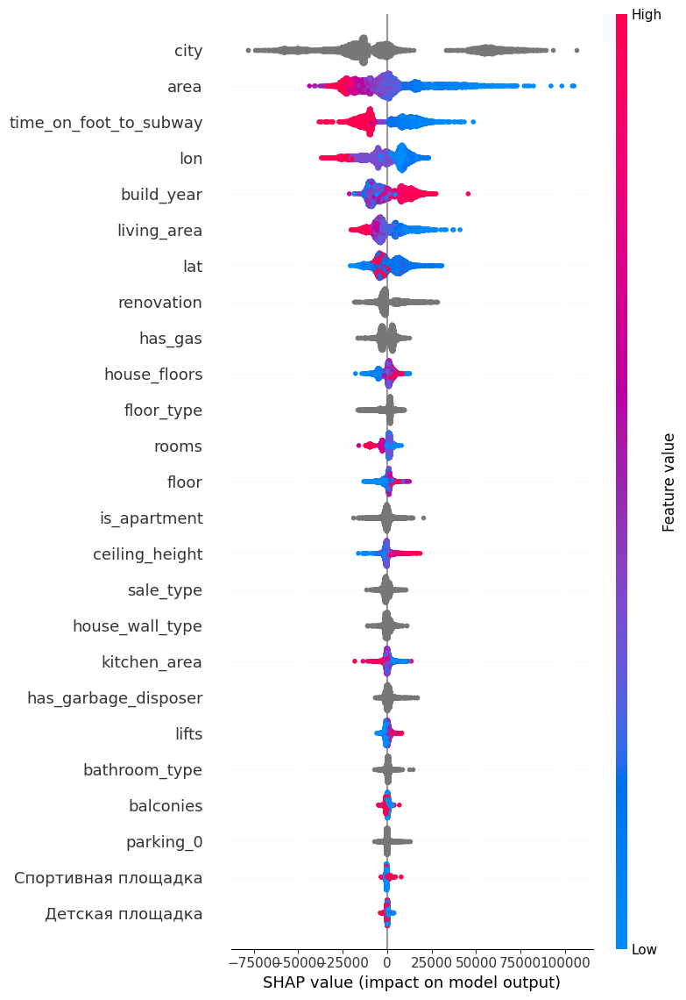

In [158]:
import shap
shap.initjs()
shap_test = shap.TreeExplainer(final_cat).shap_values(features)
shap.summary_plot(shap_test, features,
                      max_display=25, auto_size_plot=True)

### LightGBM

In [159]:
features_train_lgb = features_train.copy().astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',                 
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})
features_test_lgb = features_test.copy().astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',               
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})

In [160]:
def lgb_regr(features, target):
    model = LGBMRegressor()
    params = {
        'boosting_type' : ['gbdt'],
        'n_estimators' : [100, 300, 500],
        'max_depth' : [5, 7, 10],
        'verbose' : [10],
        'random_state' : [12345],
        'force_col_wise': [True],
        'num_leaves' : [127]}
    grid_cv = GridSearchCV(estimator=model, param_grid=params, cv=3, n_jobs=-1, scoring='neg_mean_absolute_error')
    grid_cv.fit(features, target, categorical_feature=cat_features)
    print('Best hyperparams: ', grid_cv.best_params_)
    print('MAE score on train sample: {:.2f}'.format(-grid_cv.best_score_))
    return grid_cv.best_params_

In [161]:
%%time
lgb_params = lgb_regr(features_train_lgb, target_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.803227
[LightGBM] [Info] Total Bins 1639
[LightGBM] [Info] Number of data points in the train set: 6073, number of used features: 29
[LightGBM] [Info] Start training from score 199652.870245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 91 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 86 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 87 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 50 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 7
[LightGBM] [Warning]

In [162]:
%%time
model_lgb = LGBMRegressor(**lgb_params)

model_lgb.fit(features_train_lgb, target_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.803227
[LightGBM] [Info] Total Bins 1639
[LightGBM] [Info] Number of data points in the train set: 6073, number of used features: 29
[LightGBM] [Info] Start training from score 199652.870245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 91 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 86 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 87 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 7
[LightGBM] [Warning]

LGBMRegressor(force_col_wise=True, max_depth=7, n_estimators=500,
              num_leaves=127, random_state=12345, verbose=10)

In [163]:
predict_lgb = model_lgb.predict(features_train_lgb)

mae_lgb = mean_absolute_error(target_train, predict_lgb)
mae_lgb

5977.8604296929225

6007.840027243468

5949.420243208892

6018.717538048621

3561.7824045663906

In [164]:
r2_score(target_train, predict_lgb)

0.9906384695530023

0.9906297176441954

In [165]:
predict_lgb = model_lgb.predict(features_test_lgb)

mae_lgb = mean_absolute_error(target_test, predict_lgb)
mae_lgb

14901.683381619836

16487.58457436382

16595.76607103932

16526.313608092274

16528.80279008849

In [166]:
r2_score(target_test, predict_lgb)

0.9254854754706094

0.9138418849113593

0.9130512205503749

In [167]:
'''
%%time
model_lgb = LGBMRegressor(**lgb_params)

model_lgb.fit(features_train_lgb, target_train, eval_set=(features_test_lgb, target_test), verbose=100, eval_metric='mae')

predict_lgb = model_lgb.predict(features_train_lgb)

mae_lgb = mean_absolute_error(target_train, predict_lgb)
print('Test MAE = {:.2f}'.format(mae_lgb))
'''

"\n%%time\nmodel_lgb = LGBMRegressor(**lgb_params)\n\nmodel_lgb.fit(features_train_lgb, target_train, eval_set=(features_test_lgb, target_test), verbose=100, eval_metric='mae')\n\npredict_lgb = model_lgb.predict(features_train_lgb)\n\nmae_lgb = mean_absolute_error(target_train, predict_lgb)\nprint('Test MAE = {:.2f}'.format(mae_lgb))\n"

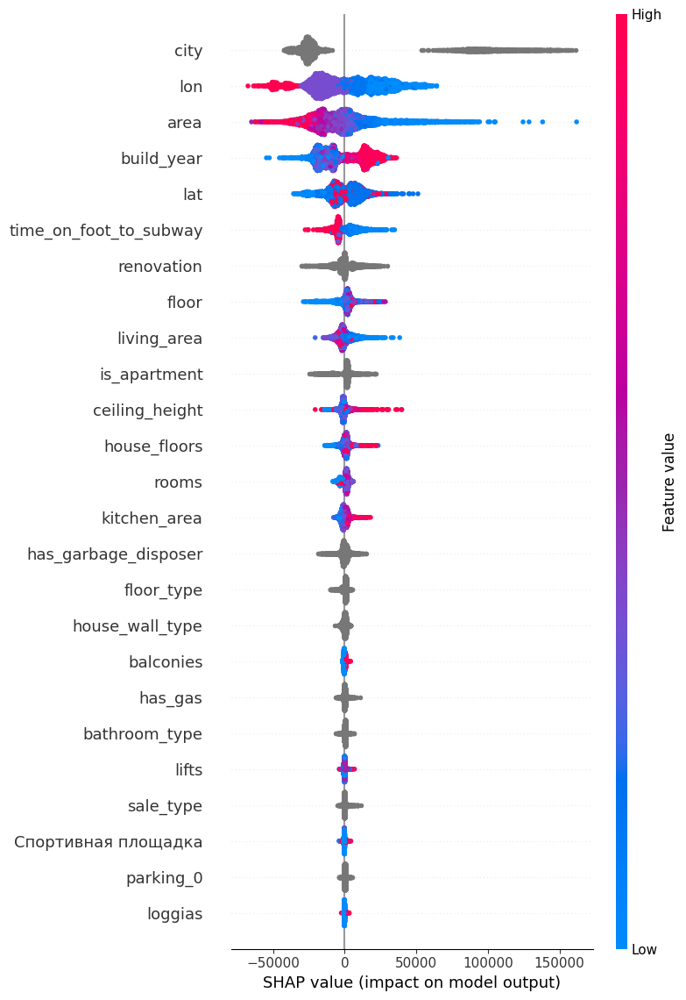

In [168]:
import shap
shap.initjs()
shap_test = shap.TreeExplainer(model_lgb).shap_values(features_train_lgb)
shap.summary_plot(shap_test, features_train_lgb,
                      max_display=25, auto_size_plot=True)

## Прогноз цены для квартир из файла flats

In [169]:
features_full = pd.concat([features_train_lgb, features_test_lgb], ignore_index=True)

In [170]:
features_full = features_full.astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',               
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})

In [171]:
# обучим модель на всем наборе данных
model_lgb.fit(features_full, pd.concat([target_train, target_test], ignore_index=True))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.803887
[LightGBM] [Info] Total Bins 1652
[LightGBM] [Info] Number of data points in the train set: 7592, number of used features: 29
[LightGBM] [Info] Start training from score 198843.317571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 92 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 88 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 92 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 86 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 51 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 7
[LightGBM] [Warning]

LGBMRegressor(force_col_wise=True, max_depth=7, n_estimators=500,
              num_leaves=127, random_state=12345, verbose=10)

features_train_lgb.info()

features_test_lgb.info()

In [172]:
features_df_flats = df_flats.copy().astype({"city":'category',
                                  "bathroom_type":'category',
                                  "renovation":'category',
                                  "is_apartment":'category',
                                  "has_gas":'category',
                                  "house_wall_type":'category',                 
                                  "sale_type":'category',
                                  "has_garbage_disposer":'category',
                                  "parking_0":'category',
                                  "floor_type":'category'})

features_df_flats.info()

features_train_lgb.info()

In [173]:
predict_test = model_lgb.predict(features_df_flats)

In [174]:
df_flats['predict_price'] = predict_test

In [176]:
df_flats['primary_price'] = primary_price_sq

In [177]:
df_flats['primary_renovation'] = primary_renovation

In [178]:
df_flats.to_csv('optimum_flats_del_renov.csv', index=False)

In [179]:
df_flats.to_excel('optimum_flats_del_renov.xlsx', index=False)

In [180]:
#df_flats[df_flats['primary_renovation']=='Дизайнерский'][['city','area', 'floor', 'primary_renovation','predict_price', 'primary_price']]

In [181]:
#df_flats[df_flats['primary_renovation']=='Дизайнерский'].shape

In [182]:
#((df_flats[df_flats['primary_renovation']=='Дизайнерский']['primary_price']-df_flats[df_flats['primary_renovation']=='Дизайнерский']['predict_price'])>0).sum()

<Figure size 1000x800 with 0 Axes>

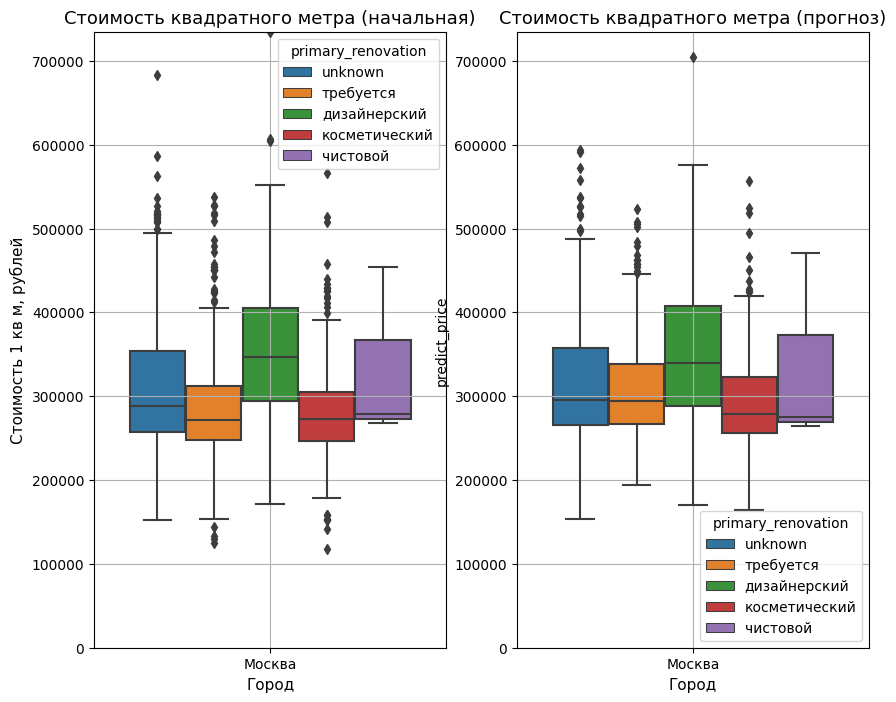

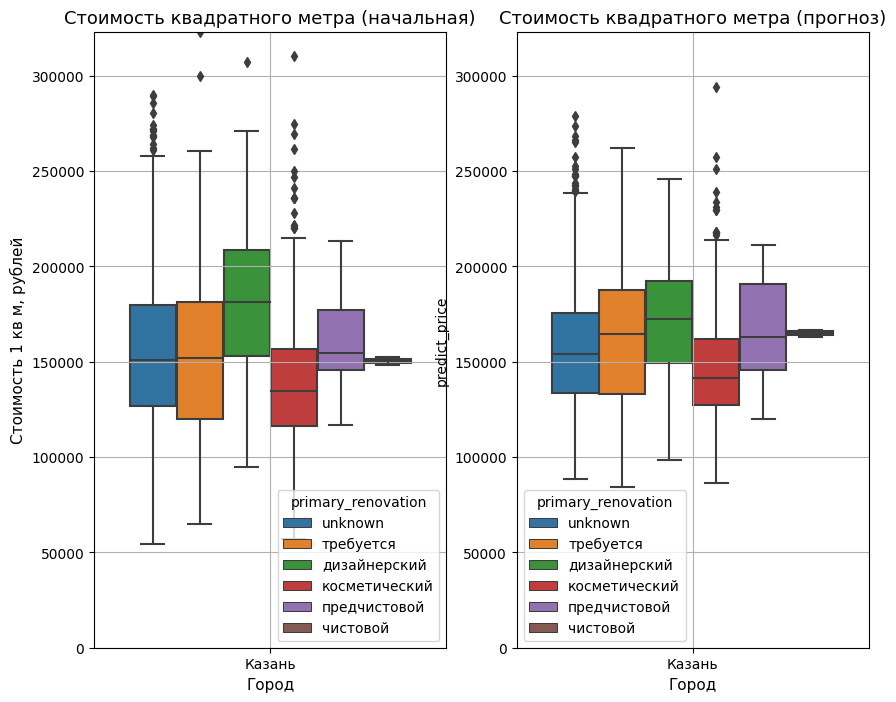

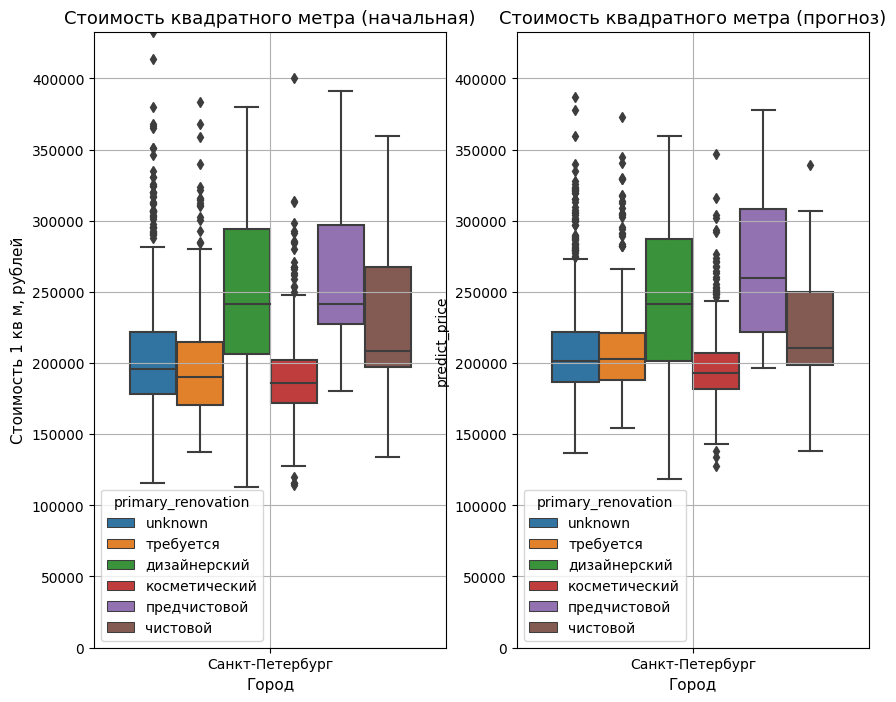

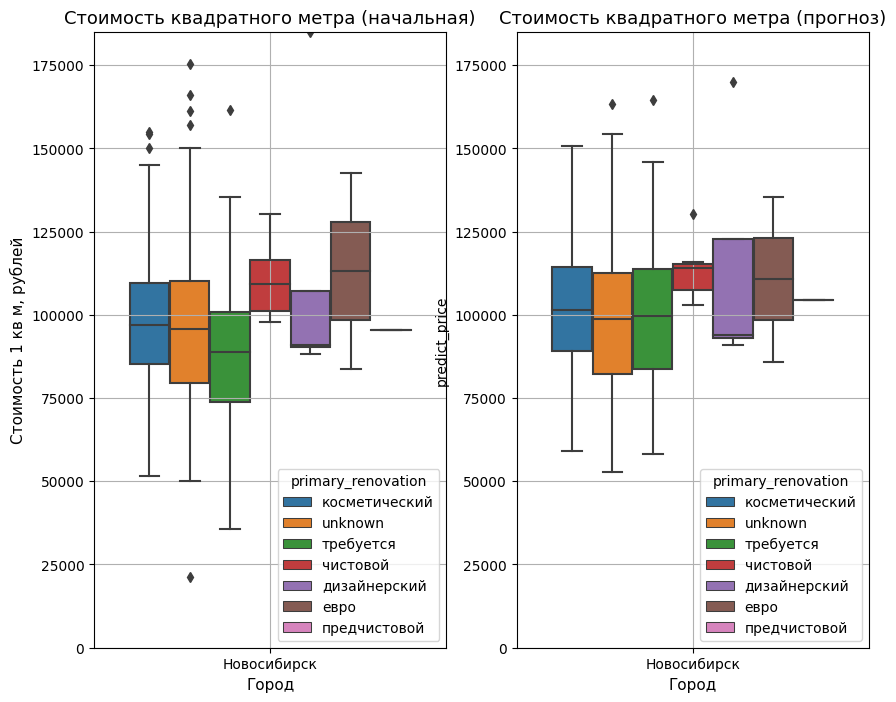

In [183]:
#построим график зависимости стоимости квадратного метра от вида ремонта (вторичка)

new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))

for city in cities:
    plt.figure(figsize=(10, 8))
    plt.subplot(1, 2, 1)
    box_plot = sns.boxplot(
    y='primary_price', x='city', 
    data = df_flats.query('city == @city and sale_type not in @new_house'), 
    width= 0.8, #palette="Set2",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type not in @new_house')['primary_price'].max()+10)
    plt.title("Стоимость квадратного метра (начальная)", fontsize= 13)
    box_plot.grid()

    plt.subplot(1, 2, 2)
    box_plot = sns.boxplot(
    y='predict_price', x='city', 
    data = df_flats.query('city == @city and sale_type not in @new_house'), 
    width= 0.8,  #palette="Paired",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    #plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type not in @new_house')['primary_price'].max()+10)
    plt.title("Стоимость квадратного метра (прогноз)", fontsize= 13)
    box_plot.grid()
    plt.show()

<Figure size 1000x800 with 0 Axes>

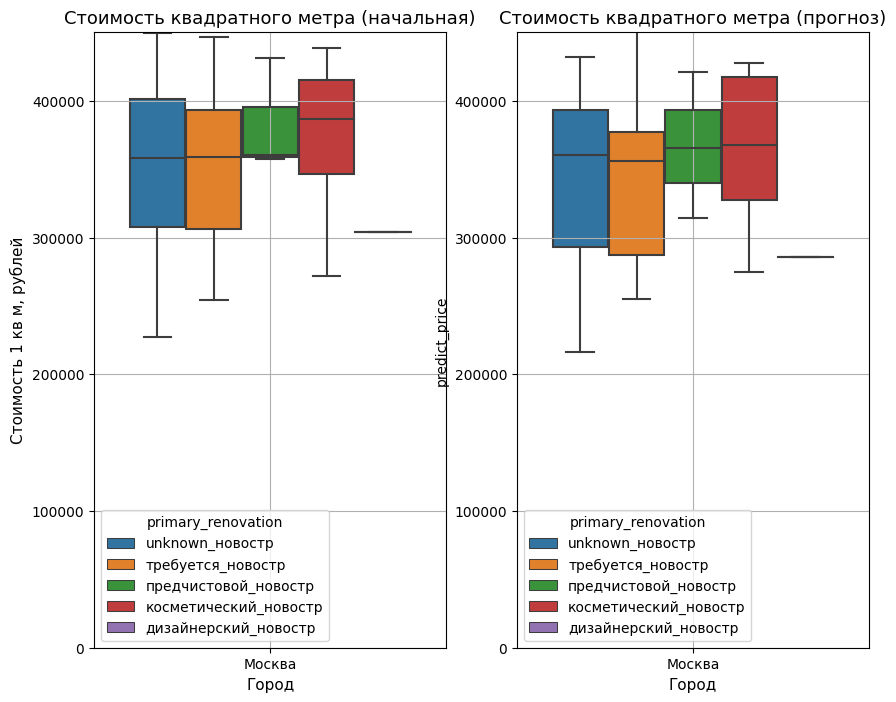

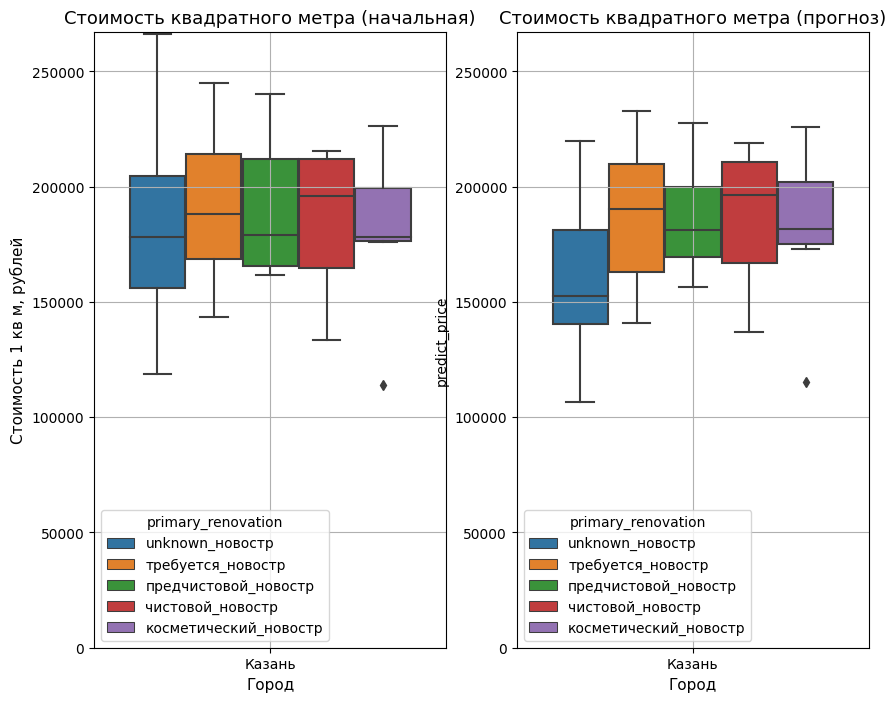

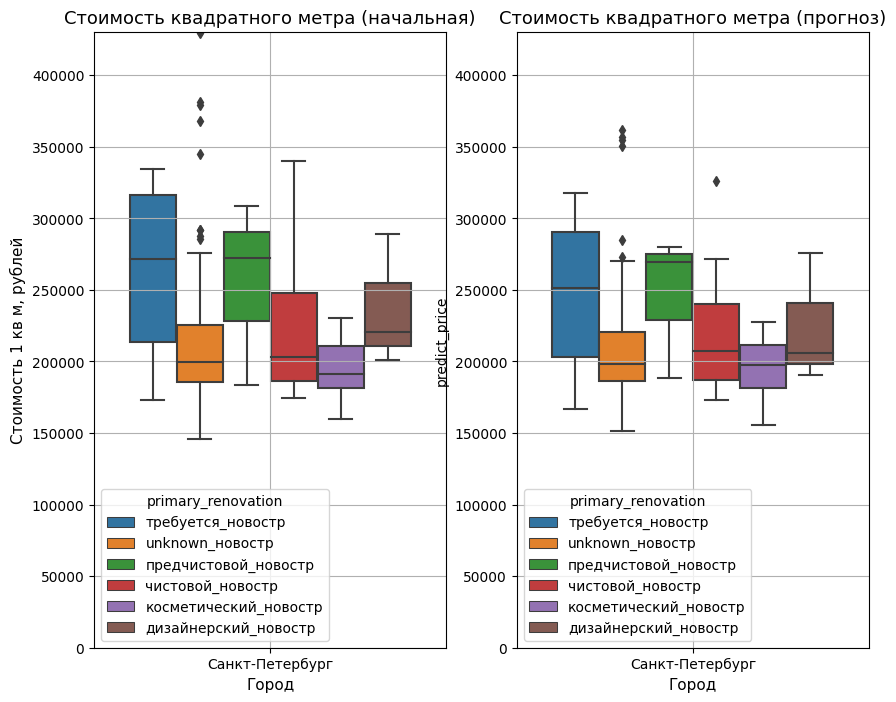

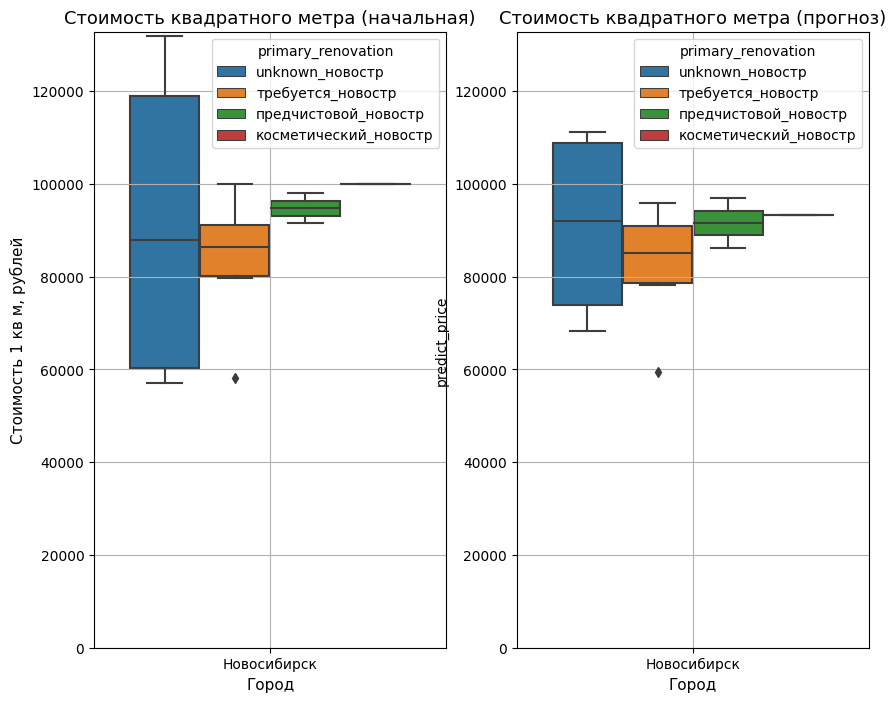

In [184]:
#построим график зависимости стоимости квадратного метра от вида ремонта (первичка)

new_house = ['Переуступка', 'Первичная продажа']
plt.figure(figsize=(10, 8))

for city in cities:
    plt.figure(figsize=(10, 8))
    plt.subplot(1, 2, 1)
    box_plot = sns.boxplot(
    y='primary_price', x='city', 
    data = df_flats.query('city == @city and sale_type in @new_house'), 
    width= 0.8, #palette="Set2",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type in @new_house')['primary_price'].max()+1000)
    plt.title("Стоимость квадратного метра (начальная)", fontsize= 13)
    box_plot.grid()

    plt.subplot(1, 2, 2)
    box_plot = sns.boxplot(
    y='predict_price', x='city', 
    data = df_flats.query('city == @city and sale_type in @new_house'), 
    width= 0.8,  #palette="Paired",
    #notch= True,
    hue='primary_renovation')

    plt.xlabel("Город", fontsize= 11)
    #plt.ylabel("Стоимость 1 кв м, рублей", fontsize= 11)
    plt.ylim(0, df_flats.query('city == @city and sale_type in @new_house')['primary_price'].max()+1000)
    plt.title("Стоимость квадратного метра (прогноз)", fontsize= 13)
    box_plot.grid()
    plt.show()

In [195]:
# добавим столбец с предсказанием в файл xlsx
workbook = openpyxl.load_workbook('flats.xlsx')

sheet = workbook['Квартиры без евроремонта']

for i, value in enumerate(list(predict_test)):
    sheet.cell(row=i+3, column=38).value = value

workbook.save('flats_euro.xlsx')

## Отчет

**Коротко о концепции:** было решено объединить данные по квартирам из файлов flats и euro_renovation в один общий датасет и обучить модель предсказывать стоимость квадратного метра для всех типов ремонта. А уже после этого заменить в файле flats столбец с типом ремонта на евро и спрогнозировать стоимость квадратного метра недвижимости для этих "обновленных" квартир из файла flats.

**Теперь подробнее**

Разработка модели для прогнозирования стоимости квартиры с учетом параметров квартиры и выполнения евроремонта проходила в несколько этапов:

- подготовка данных
- исследовательский анализ данных
- построение и обучение модели

На этапе подготовки были загружены данные из файлов xlsx и объединены в один общий датасет. Т.к. загрузка занимает довольно продолжительное время, сразу сохранили файлы в формате csv в рабочую папку. 

Затем мы ознакомились с данными, для удобства переименовали столбцы. Выяснили, что в данных большое количество пропусков. В некоторых столбцах их процент превышает 80% от общего количества записей. Избавление от пропусков и устранение неявных дублей - важный и трудоемкий этап предварительной обработки данных. 

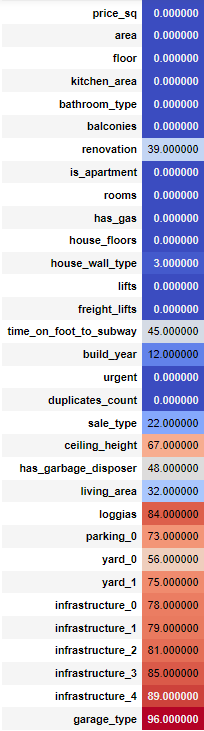

В ходе проведения исследования данных было выяснено, что в датасете встречаются квартиры, продающиеся в одном и том же доме. Это оказалось ценным наблюдением и позволило заполнить недостающие характеристики домов реальными, несинтетическими данными.  

В результате были обработаны следующие колонки: 'price_sq', 'renovation', 'house_wall_type',  'time_on_foot_to_subway', 'sale_type', 'parking_0', 'build_year', 'has_garbage_disposer', 'duplicates_count', 'ceiling_height', 'living_area', 'loggias', 'yard_0', 'yard_1'. Некоторые колонки не несли ценной информации, поэтому их просто удалили (id, infrastructure, offer_views). Был добавлен новый признак - тип этажа (первый, последний, средний). 

После того, как данные были подготовлены, мы провели анализ стоимости квартир в зависимости от разных параметров (город, количество комнат, тип ремонта, тип продажи). Результаты получились интересные, а графики - занятные и наглядные. Одно из наблюдений: типы ремонта в зависимости от типа продажи (первичка, вторичка) по разному влияют на цену квартиры. Этот момент учли, введя дополнительные типы ремонта для новостроек. Второй момент: квартиры с дизайнерским ремонтом, как правило, стоят дороже, чем с евроремонтом. То есть для квартир с дизайнерским ремонтом модель может предсказать более низкую стоимость, если изменить тип ремонта на евро.

Далее непосредственно перешли к этапу подготовки моделей. 

В качестве моделей машинного обучения были выбраны бустинговые модели CatBoostRegressor и LGBMRegressor. Выбор пал на них по ряду причин. 
- Во-первых, они отличаются высокой точностью предсказаний и позволяют довольно быстро обрабатывать большие объемы информации. 
- Во-вторых, они обладают устойчивостью к выбросам и шуму в данных. 
- И, в-третьих, они умеют использовать категориальные признаки без их предварительного кодирования.

Метрикой качества выбрали MAE (средняя абсолютная ошибка) и R2 (коэффициент детерминации). Эти метрики являются стандартными и широко используются в машинном обучении. MAE показывает среднее значение абсолютных ошибок модели, то есть насколько сильно модель ошибается в своих прогнозах, легко интерпретируема. R2 показывает, насколько хорошо модель соответствует данным (она измеряет долю дисперсии зависимой переменной, которая объясняется моделью). 

Наилучший результат показала модель LGBMRegressor. Её разультат MAE на тренировочной выборке 5977.8604296929225, на тестовой 14901.683381619836. R2 0.9906384695530023 и 0.9254854754706094 соответственно. Валидационную выборку не применяли, т.к. пользовались инструментом grid search с кроссвалидацией. 

Итак, какие выводы можем сделать из полученных резльтатов:
- наличие евроремонта положительно (увеличивает цену) сказывается для вторички для категорий ремонта "требуется" и "косметический" (Москва)
- наличие евроремонта положительно (увеличивает цену) сказывается для вторички для категорий ремонта "требуется", "косметический" и "предчистовой" (Казань, СПб)
- наличие евроремонта положительно (увеличивает цену) сказывается для вторички для категорий ремонта "требуется", "косметический", "дизайнерский" (Новосибирск) 
- во всех городах, кроме Новосибирска, квартиры с дизайнерским ремонтом после нового евроремонта рискуют подешеветь, т.е. дизайнерский ремонт стоит дороже евроремонта
- для первичного рынка ситуация особенная: цены на новостройки сами по себе довольно высокие и наличие евроремонта практически не оказывает влияния на цену

## Pandas Profiling Report

In [185]:
display(ProfileReport(df))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


medians = df_flats.query('city in @cities and sale_type not in @new_house').groupby(['primary_renovation'])['predict_price'].median()
vertical_offset = df_flats.query('city in @cities and sale_type not in @new_house')['predict_price'].median() * 0.05 # offset from median for display

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')